# High magnitude flows
## Hydrograph comparison for observed, unimpaired, and diverted flows along Tuolumne R.
### Author: Kirsten Ondris
***

### Import packages

In [5]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
#plt.rcParams['figure.dpi'] = 600
from scipy import stats
import seaborn as sns
from matplotlib.pyplot import cm
import dataretrieval.nwis as nwis
from scipy.signal import argrelextrema
from collections import defaultdict
from cdec_scraper import cdec_sensor_data
from datetime import date #for date.today() function
from matplotlib.dates import MonthLocator, DateFormatter # for plotting month on x-axis

In [6]:
# Conversions
MAF_to_km3 = 1e6 * 43560 * 0.0283 * 1e-9
km3_to_MAF = 1 / (1e6 * 43560 * 0.0283 * 1e-9)
cfs_to_maf = 60 * 60 * 24 / 43560 / 1e6

## Set parameters

In [7]:
### 1. Select site(s) ###
#sites = [11447650, 11303500] # Sacramento River at Freeport, San Joaquin Basin at Vernalis
# sites = [11447650] # Sacramento River at Freeport
# site = 11447650
#sites = [11303500] # San Joaquin Basin at Vernalis
#site = 11303500
# sites = [11289650] # Tuolumne R Bl Lagrange Dam Nr Lagrange CA
# site = '11289650' # Tuolumne R Bl Lagrange Dam Nr Lagrange CA
# sites = [11290000] # Tuolumne R at Modesto
# site = '11290000' # Tuolumne R at Modesto
sites = [11289650, 11290000] # Tuolumne R Bl Lagrange Dam Nr Lagrange CA, Tuolumne R at Modesto

### 2. Select corresponding site(s) for files ###
#selected_sites = 'SRB_SJB'
#selected_sites = 'Stan_Tuol_Merc'
selected_sites = 'Tuol'

### 3. Select streamflow data type ###
flow_type = 'obs'
#flow_type = 'fnf'
#flow_type = 'fnf_ferc'

### 4. Select date range for streamflow record ###
#start_year = '1929'
start_year = '1993'
start_date = start_year+'-10-01' # '1929-10-01'
#end_date = '2015-04-28' # ending date for Kocis paper
end_date = '2023-09-30' # include most recent 30-year record

### 5. Select corresponding date range for files ###
#selected_record = 'full_rec'
selected_record = '30yr_rec'
#selected_record = 'post-imp'

### 6. Select threshold for HMF ###
selected_threshold = 'p90'
#selected_threshold = '2yr_event'
#selected_threshold = '3yr_event'
#selected_threshold = '5yr_event'
#selected_threshold = '10yr_event'

## Download streamflow data

In [8]:
# Download observed daily streamflow (USGS)
def download_obs_flow(site_id, start_date, end_date):
    df = nwis.get_record(sites=str(site_id), service='dv', start=start_date, end=end_date, parameterCd='00060').drop(columns=['00060_Mean_cd', 'site_no']).rename(columns={'00060_Mean': 'flow_cfs'})
    return df

# Replace negative values with linear interpolation (for UF dataset)
def replace_nan_with_avg(series):
    for i in range(len(series)):
        if pd.isna(series[i]):
            before = series[i - 1] if i > 0 and not pd.isna(series[i - 1]) else 0
            after = series[i + 1] if i < len(series) - 1 and not pd.isna(series[i + 1]) else 0
            series[i] = (before + after) / 2
    return series

# Download and clean unimpaired flow (UF) daily streamflow
def download_uf(link_raw, link_clean):
    df = pd.read_csv(link, index_col=0)
    df = df.mask(df < 0, np.nan) # replace negative values with NaN
    df = df.apply(replace_nan_with_avg) # replace NaN values with average
    df.rename(columns={'TLG_FNF_CFS':'flow_cfs'}, inplace=True)
    df.to_csv(link_clean)
    #df.to_csv('C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\data_clean\\fnf_tuol_cdec_CLEAN.csv')
    return df

# Download unimpaired flow (UF) with FERC daily streamflow (developed in other code)
%run unimp_ferc_flow_construction.ipynb

# Function to get streamflow data ('daily') for selected flow type
def download_streamflow_data(flow_type):
    if flow_type == 'obs':
        if site_id == 11447650: # Sacramento River at Freeport daily data stored in two locations by USGS
            #daily = grab_usgs_mean_daily_streamflow(site_id, start_date, end_date)
            discharge_daily = nwis.get_record(sites=str(site_id), service='dv', start=start_date, end = end_date, parameterCd='00060').drop(columns=['00060_Mean_cd', 'site_no']).rename(columns={'00060_Mean': 'flow_cfs'})
            #discharge_daily2 = nwis.get_record(sites=str(site_id), service='dv', start='2015-10-01', end=end_date, parameterCd='72137').drop(columns=['72137_Mean_cd', 'site_no']).rename(columns={'72137_Mean': 'flow_cfs'})
            #discharge_daily = pd.concat([daily1, daily2])
        else: # all other gauges store daily data in parameterCd 00060
            discharge_daily = download_obs_flow(site_id, start_date, end_date)
    elif flow_type == 'uf':
        discharge_daily = clean_uf_data('C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\data_raw\\fnf_tuol_cdec.csv')
    else:
        discharge_daily = pd.read_csv('C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\data_clean\\fnf_with_ferc.csv', index_col=0, parse_dates=True)
    #fnf = cdec_sensor_data(cdec_sensor, 8, 'D', sd='1993-10-01', ed='2022-09-30')
    return discharge_daily

### Threshold functions to calculate HMF ###

def calc_p90(df):
    return round(df['flow_cfs'].quantile(0.9), 1) # 90th percentile

def calc_retper_flow(site_id, T):
#     if sites_df.loc[site_id, 'peakData'] == 'y':
#         qpeakDF = nwis.get_record(sites=str(site_id), service='peaks', start=start_date, end=end_date).drop(columns=['agency_cd', 'site_no'])
#         qpeak = qpeakDF['peak_va']
#     else:
#         daily = nwis.get_record(sites=str(site_id), service='dv', start=start_date, end=end_date, parameterCd='00060').drop(columns=['00060_Mean_cd', 'site_no']).rename(columns={'00060_Mean': 'flow_cfs'})
#         qpeak = daily['flow_cfs'].resample('AS-OCT').max()
#         print(qpeak)
    qpeakDF = nwis.get_record(sites=str(site_id), service='peaks', start=start_date, end=end_date).drop(columns=['agency_cd', 'site_no'])
    qpeak = qpeakDF['peak_va']
    x = qpeak.values
    x[x == 0] = 0.01    
    y = np.log(x)
    m = np.mean(y) # sample mean in LOG SPACE
    s = np.std(y) # sample STD in LOG SPACE
    Zp = stats.norm.ppf(1 - 1/T) # Z-score for 99%; inverse CDF 
    g = stats.skew(y)
    Kp = (2/g)*(1 + g*Zp/6 - g**2/36)**3 - 2/g
    return np.exp(m + Kp*s)

def thresholds_flow(daily):
    # Set up df with column names
    key_names = ['p90', '2yr_event', '3yr_event', '5yr_event', '10yr_event', 'flood_DWR']
    #df = pd.DataFrame(columns=column_names)
    
    # Calculate thresholds
    p90 = calc_p90(daily)
    
    ret_per = [2, 3, 5, 10]
    for T in ret_per:
        flow = calc_retper_flow(site_id, T)
        if T == 2:
            retper_2yr = flow 
        elif T == 3:
            retper_3yr = flow 
        elif T == 5:
            retper_5yr = flow 
        else:
            retper_10yr = flow 
    
    flood_DWR = 8500 # cfs, Tuolumne R. only
            
    # Create list of threshold values
    values_list = [p90, retper_2yr, retper_3yr, retper_5yr, retper_10yr, flood_DWR]

    # Add new row to the df with threshold values and set index to site_id
    #df = df.append(pd.Series(values_list, index=df.columns), ignore_index=True)
    #df = df.round(decimals = 0)
    #df['site_id'] = site_id
    #df = df.set_index('site_id')
    
    # Create dictionary of threshold labels as keys and flows as values
    dictionary = dict(zip(key_names, values_list))
    
    #thresholds_obs.to_csv(file_name)
    return dictionary

def thresholds_percentiles(discharge_daily, thresholds_flow_df):
    
    # Set up df with same column names as thresholds_flow_df
    key_names = ['p90', '2yr_event', '3yr_event', '5yr_event', '10yr_event', 'flood_DWR']
    #df = pd.DataFrame(columns=col_names)
    
    # Calculate thresholds and create list
    pctl_list = []
    for threshold in key_names:
        pctl = round((discharge_daily['flow_cfs'] < thresholds_flow_df[threshold]).mean(), 2)
        pctl_list.append(pctl)
    
    # Add new row to the df with threshold values and set index to site_id
    #df = df.append(pd.DataFrame([pctlList], columns=col_names), ignore_index=False)
    #df['site_id'] = site_id
    #df = df.set_index('site_id')
    
    # Create dictionary of threshold labels as keys and flows as values
    dictionary = dict(zip(key_names, pctl_list))
    
    return dictionary

# Create column with WY 
def add_WY_DOHY_month(df):
    df['datetime'] = pd.to_datetime(df.index)
    df['month'] = df['datetime'].dt.strftime('%m') # create month column
    df['year'] = df['datetime'].dt.strftime('%Y') # create year column 
    df['WY'] = np.where((df['month'] == '10') | (df['month'] == '11') | (df['month'] == '12'), df['year'].astype(int) + 1, df['year'].astype(int)) # create WY column where the WY resets in Oct
    df['WY'] = df['WY'].values.astype(str)
    df['DOY'] = df['datetime'].dt.dayofyear # create column with DOY
    df['DOHY'] = [d - 273 if d >= 274 else d + 91 for d in df['DOY']]
    df['datetime'] = df['datetime'].dt.date # reset index to date only (no time)
    df.set_index('datetime', inplace=True)
    columns_to_remove = ['year']
    df = df.drop(columns=columns_to_remove)
    return df
    
def calc_HMF(thresholds_flowDict, site_id, selected_threshold, df): # HMF = discharge above threshold
    threshold = float(thresholds_flowDict[site_id][selected_threshold])
    FlowAbvThresholdList = [(flow - threshold) if flow > threshold else 0 for flow in df['flow_cfs']]
    df['HMF_cfs'] = FlowAbvThresholdList
    return df

# Save observed USGS data for Tuolumne R at LGR
observed_tuol_usgs = download_obs_flow('11289650', start_date, end_date)
observed_tuol_usgs.to_csv('C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\data_clean\\observed_tuol_usgs.csv')

In [9]:
# Generate df for each flow type

# Define dictionaries to save daily discharge and threshold dataframes
flowDict = {}
thresholds_flowDict = {}
thresholds_percentileDict = {}

# Grab USGS daily discharge data for each site, add WY as a column, calculate daily HMF, and save to dictionary
for site_id in sites:
    discharge_daily = download_obs_flow(site_id, start_date, end_date)
#     if site_id == 11447650: # Sacramento River at Freeport daily data stored in two locations by USGS
#         #daily = download_obs_flow(site_id, start_date, end_date)
#         discharge_daily = nwis.get_record(sites=str(site_id), service='dv', start=start_date, end = end_date, parameterCd='00060').drop(columns=['00060_Mean_cd', 'site_no']).rename(columns={'00060_Mean': 'flow_cfs'})
#         #discharge_daily2 = nwis.get_record(sites=str(site_id), service='dv', start='2015-10-01', end=end_date, parameterCd='72137').drop(columns=['72137_Mean_cd', 'site_no']).rename(columns={'72137_Mean': 'flow_cfs'})
#         #discharge_daily = pd.concat([daily1, daily2])
#     else: # all other gauges store daily data in parameterCd 00060
#         discharge_daily = download_obs_flow(site_id, start_date, end_date)
    thresholds_flowDict[site_id] = thresholds_flow(discharge_daily)
    thresholds_percentileDict[site_id] = thresholds_percentiles(discharge_daily, thresholds_flowDict[site_id])
    discharge_daily = add_WY_DOHY_month(discharge_daily)
    discharge_daily = calc_HMF(thresholds_flowDict, site_id, selected_threshold, discharge_daily)
    flowDict['obs_'+str(site_id)] = discharge_daily 

print('done')

# flow_types = ['obs', 'fnf', 'fnf_ferc']
# flowDict = {}
# thresholds_flowDict = {}
# thresholds_percentileDict = {}

# for flow_type in flow_types:
#     discharge_daily = download_streamflow_data(flow_type)
#     #flowDict[flow_type] = discharge_daily
#     thresholds_flowDict[flow_type] = thresholds_flow(discharge_daily)
#     thresholds_percentileDict[flow_type] = thresholds_percentiles(discharge_daily, thresholds_flowDict[flow_type])
#     discharge_daily = add_WY_DOHY_month(discharge_daily)
#     discharge_daily = calc_HMF(thresholds_flowDict, 'obs', selected_threshold, discharge_daily)
#     #discharge_daily = calc_HMF(thresholds_flowDict['obs'], selected_threshold, discharge_daily) ########### use 'obs' or flow_type for thresholds_flowDict ??????? 
#     flowDict[flow_type] = discharge_daily
#     flowDict[flow_type+'_3mo'] = create_3month_df(discharge_daily)
#     flowDict[flow_type+'_4mo'] = create_4month_df(discharge_daily) 
#     flowDict[flow_type+'_6mo'] = create_6month_df(discharge_daily) 

# #print('done')
# print(flowDict)

done


In [10]:
# Test
#thresholds_flowDict[11289650]['p90']
#thresholds_flowDict
#thresholds_percentileDict
#plt.plot(flowDict['obs_11289650']['HMF_cfs'])

## Download envrionmental flows

In [11]:
# UF at TLG
fnf_11289650 = pd.read_csv('C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\data_clean\\fnf_tuol_cdec_CLEAN.csv', index_col=0, parse_dates=True)
fnf_11289650 = add_WY_DOHY_month(fnf_11289650)
flowDict['fnf_11289650'] = fnf_11289650
print(fnf_11289650.index.min())
print(fnf_11289650.index.max())

1993-10-01
2023-09-30


In [12]:
# 40% UF with FERC at TLG
fnf_ferc_11289650 = pd.read_csv('C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\data_clean\\fnf_with_ferc.csv', index_col=0, parse_dates=True)
fnf_ferc_11289650 = add_WY_DOHY_month(fnf_ferc_11289650)
flowDict['fnf_ferc_11289650'] = fnf_ferc_11289650
#fnf_ferc_11289650 = calc_HMF(thresholds_flowDict, site_id, selected_threshold, fnf_ferc_11289650)
start_date_fnf = fnf_ferc_11289650.index.min()
end_date_fnf = fnf_ferc_11289650.index.max()
print(start_date_fnf)
print(end_date_fnf)

1993-10-01
2023-09-30


In [13]:
# CEFF at TLG - ALSO ADD AT MODESTO

def ceff_mean_monthly(data_raw):
    # Open csv as df
    df = pd.read_csv(data_raw)
    
    # Create a date column from the year and month columns
    df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))
    
    # Set the index as the date column
    df.set_index('date', inplace=True)
    
    # Rename the value column as flow and remove dfs
    df.rename(columns={'value': 'flow_cfs'}, inplace=True)
    df = df.drop(['statistic', 'variable', 'year', 'month'], axis=1)
    
    # Add WY to df
    df = add_WY_DOHY_month(df)
    
    # Select rows to match other dfs
    df = df[start_date_fnf:end_date_fnf]
    
    return df

# Open csv as df
ceff_mean_11289650 = pd.read_csv('C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\data_clean\\flow_2823750_mean_estimated_1950_2023_monthly.csv', index_col=0, parse_dates=True)

# Create a date column from the year and month columns
ceff_mean_11289650['date'] = pd.to_datetime(ceff_mean_11289650[['year', 'month']].assign(day=1))

# Set the index as the date column
ceff_mean_11289650.set_index('date', inplace=True)

# Rename the value column as flow and remove dfs
ceff_mean_11289650.rename(columns={'value': 'flow_cfs'}, inplace=True)
ceff_mean_11289650 = ceff_mean_11289650.drop(['statistic', 'variable', 'year', 'month'], axis=1)

# Add WY to df
ceff_mean_11289650 = add_WY_DOHY_month(ceff_mean_11289650)

# Select rows to match other dfs
ceff_mean_11289650 = ceff_mean_11289650[start_date_fnf:end_date_fnf]
ceff_mean_11289650

,flow_cfs,month,WY,DOY,DOHY
datetime,,,,,
1993-10-01,377.193525,10,1994,274,1
1993-11-01,429.131192,11,1994,305,32
1993-12-01,594.601506,12,1994,335,62
1994-01-01,440.729662,01,1994,1,92
1994-02-01,755.295054,02,1994,32,123
...,...,...,...,...,...
2023-05-01,10448.108000,05,2023,121,212
2023-06-01,7628.476823,06,2023,152,243
2023-07-01,2764.380828,07,2023,182,273


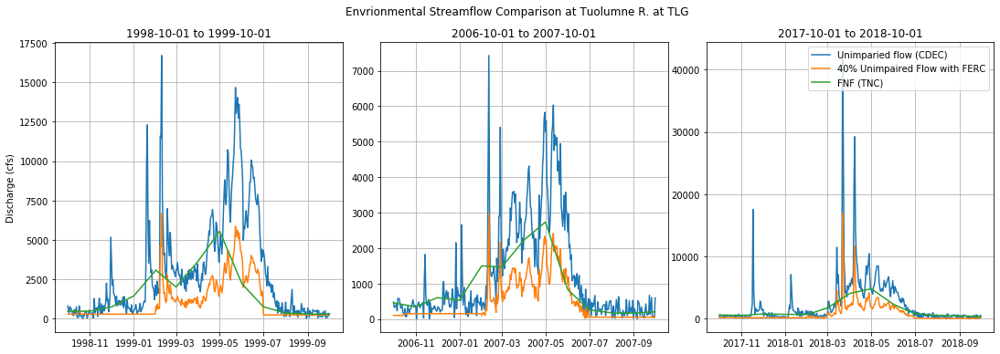

In [14]:
# Comparison between 40% FNF FERC flows and CEFF flows at TLG gage

date_ranges = [('10-01-1998','10-01-1999'), ('10-01-2006','10-01-2007'), ('10-01-2017','10-01-2018')]

plt.rcParams['axes.grid'] = True
fig, ax = plt.subplots(1,3, figsize=(15,5))
fig.tight_layout()
fig.suptitle('Envrionmental Streamflow Comparison at Tuolumne R. at TLG', y=1.07)

for i, (start_date, end_date) in enumerate(date_ranges):
    
    from datetime import datetime
    start_date = datetime.strptime(start_date, '%m-%d-%Y').date()
    end_date = datetime.strptime(end_date, '%m-%d-%Y').date()
    
    fnf_subset = fnf_11289650[(fnf_11289650.index >= start_date) & (fnf_11289650.index <= end_date)]
    fnf_ferc_subset = fnf_ferc_11289650[(fnf_ferc_11289650.index >= start_date) & (fnf_ferc_11289650.index <= end_date)]
    ceff_mean_subset = ceff_mean_11289650[(ceff_mean_11289650.index >= start_date) & (ceff_mean_11289650.index <= end_date)]
    
    ax[i].plot(fnf_subset['flow_cfs'], label='Unimparied flow (CDEC)')
    ax[i].plot(fnf_ferc_subset['flow_cfs'], label='40% Unimpaired Flow with FERC')
    ax[i].plot(ceff_mean_subset['flow_cfs'], label='FNF (TNC)')
    ax[0].set_ylabel('Discharge (cfs)')
    ax[i].set_title(f'{start_date} to {end_date}')
    
plt.legend()
file_name = '../results/figures/timeseries/streamflow/'+selected_sites+'/environmental_flow_comparison_TLG.png'
plt.savefig(file_name, bbox_inches="tight")
plt.show()


In [15]:
# Find area under the CEFF plots
from scipy.integrate import trapz

# Calculate the time difference in days
ceff_mean_11289650['Date'] = ceff_mean_11289650.index
ceff_mean_11289650['Days'] = (ceff_mean_11289650['Date'] - ceff_mean_11289650['Date'].shift(1)).dt.days.fillna(0)
ceff_mean_11289650['Days_cumsum'] = ceff_mean_11289650['Days'].cumsum()

# Calculate the area under the curve for each month
areas = []

for i in range(len(ceff_mean_11289650) - 1):
    x_values = [ceff_mean_11289650['Days_cumsum'][i], ceff_mean_11289650['Days_cumsum'][i+1]]
    y_values = [ceff_mean_11289650['flow_cfs'][i], ceff_mean_11289650['flow_cfs'][i+1]]
    area = trapz(y_values, x=x_values)
    areas.append(area)

# Add 0 as first value to have lengths of list match
areas.insert(0, 0)
ceff_mean_11289650['flow_area_cfs'] = areas

## Water rights data

In [16]:
# Annual monthly data 
cfs_to_maf = 60 * 60 * 24 / 43560 / 1e6
# diversions_annual = pd.read_excel('../water_rights_ewrims/tuol_river_wr.xlsx', sheet_name='Diversions_annual', index_col=0)#, parse_dates=True)
# diversions_annual_sum = diversions_annual.sum(axis=1) / 1E6 / cfs_to_maf / 365
# diversions_annual_sum = diversions_annual_sum.to_frame(name='flow_cfs')
# diversions_annual_sum['datetime'] = pd.to_datetime(diversions_annual_sum.index.astype(str) + '-10-01')
# diversions_annual_sum.set_index('datetime', inplace=True)
# diversions_annual_sum

# Upload excel file
#diversions_monthly = pd.read_excel('../water_rights_ewrims/tuol_river_wr_monthly.xlsx', sheet_name='Diversions_monthly')#, parse_dates=True)
diversions_monthly = pd.read_excel('../water_rights_ewrims/tuol_river_wr_turlock.xlsx', sheet_name='monthly')

# Set datetime index to year, month, day columns
diversions_monthly['datetime'] = pd.to_datetime(diversions_monthly[['year', 'month', 'day']])
diversions_monthly.set_index('datetime', inplace=True)
diversions_monthly = diversions_monthly.drop(['year', 'month', 'day'], axis='columns')

# Convert flow from AF/month to cfs
diversions_monthly['flow_cfs'] = diversions_monthly['diversions_af'] / 1E6 / cfs_to_maf / 30
diversions_monthly['mag_MAF'] = diversions_monthly['diversions_af'] / 1E6

# Order dates to plot correctly
diversions_monthly.sort_values(by='datetime', inplace = True)

diversions_monthly.head()

#plt.plot(diversions_monthly['flow_cfs'])
#plt.fill_between(x=diversions_monthly['flow_cfs'].index, y1=0, y2=diversions_monthly['flow_cfs'], color='coral', label='Water Rights Allocations', alpha=0.6)

,diversions_af,flow_cfs,mag_MAF
datetime,,,
2010-01-01,195732,3289.385000,0.195732
2010-02-01,157078,2639.783056,0.157078
2010-03-01,307708,5171.203889,0.307708
2010-04-01,398855,6702.979861,0.398855
2010-05-01,682177,11464.363472,0.682177


In [17]:
# Annual diversion data - subset
div_annual_subset = pd.read_csv('tuol_river_subset_annual_flows.csv', index_col=0)
div_annual_subset.head()

,S007652,S011103,A001233,S011191,S009071,A003648,A012262,A015371,A009996,S014004,...,S021737,S021738,S021739,A031958,S024721,S025745,S025746,S026169,A033277,sum
Year,,,,,,,,,,,,,,,,,,,,,
1994,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1995,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1996,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


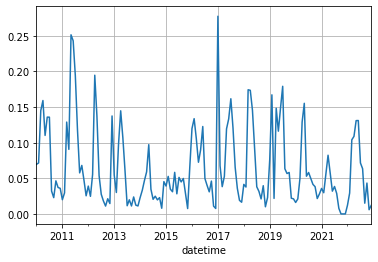

In [18]:
# Monthly diversion data - subset
div_monthly_subset = pd.read_excel('../water_rights_ewrims/tuol_river_subset_monthly_flows.xlsx', sheet_name='div_monthly')#, parse_dates=True)
div_monthly_subset['datetime'] = pd.to_datetime(div_monthly_subset[['year', 'month', 'day']])
div_monthly_subset.set_index('datetime', inplace=True)
div_monthly_subset = div_monthly_subset.drop(['year', 'month', 'day'], axis='columns')

# Convert flow from AF/month to cfs
div_monthly_subset['flow_cfs'] = div_monthly_subset['div_AF'] / 1E6 / cfs_to_maf / 30
div_monthly_subset['mag_MAF'] = div_monthly_subset['div_AF'] / 1E6

# Order dates to plot correctly
div_monthly_subset.sort_values(by='datetime', inplace = True)

div_monthly_subset['mag_MAF'].plot()

## Determine dry, moderate and wet years

In [19]:
# Determine what years are dry, moderate, or wet based on streamflow at TLG

# Calculate the mean annual streamflow for each WY
flowDict['obs_11289650'].index = pd.to_datetime(flowDict['obs_11289650'].index) # convert Index to DatetimeIndex
mean_annual_flows = flowDict['obs_11289650']['flow_cfs'].resample('AS-OCT').mean()

# Sort the mean streamflow values from smallest to largest
sorted_series = mean_annual_flows.sort_values()

# Calculate the length of the Series
series_length = len(sorted_series)

# Determine the index up to the first third and second third values, rounded to the nearest integer
index_first_third = series_length // 3
index_second_third = index_first_third * 2

# Extract the first third of values using head()
dry_years = sorted_series.head(index_first_third).index.year.tolist()
dry_years_set = set(dry_years)
dry_years = [year + 1 for year in dry_years] # add 1 to get water year
dry_years_df = pd.DataFrame(dry_years, columns=['WY'])
dry_years_df['WYT'] = 'Dry'

# Subtract the years in the dry_years from the second third of values using set()
moderate_years = list(set(sorted_series.head(index_second_third).index.year.tolist()) - dry_years_set)
moderate_years_set = set(moderate_years)
moderate_years = [year + 1 for year in moderate_years]
moderate_years_df = pd.DataFrame(moderate_years, columns=['WY'])
moderate_years_df['WYT'] = 'Moderate'

# Subtract the years in the dry_years and moderate_years from the full list of years using set()
wet_years = list(set(sorted_series.index.year.tolist()) - dry_years_set - moderate_years_set)
wet_years = [year + 1 for year in wet_years]
wet_years_df = pd.DataFrame(wet_years, columns=['WY'])
wet_years_df['WYT'] = 'Wet'

# Combine dataframes into one df using concat() and axis=0 to concatenate along rows
WYT_df = pd.concat([dry_years_df, moderate_years_df, wet_years_df], axis=0)
WYT_df = WYT_df.sort_values(by='WY')
WYT_df = pd.DataFrame(WYT_df)
WYT_df

WYT_1994_2023 = WYT_df['WYT'].tolist()

# Create column for index with year of WY column followed by 01-01
WYT_df['datetime'] = pd.to_datetime(WYT_df['WY'].astype(str) + '-01-01')
WYT_df.set_index('datetime', inplace=True)

WYT_df

,WY,WYT
datetime,,
1994-01-01,1994,Dry
1995-01-01,1995,Wet
1996-01-01,1996,Wet
1997-01-01,1997,Wet
1998-01-01,1998,Wet
1999-01-01,1999,Moderate
2000-01-01,2000,Moderate
2001-01-01,2001,Moderate
2002-01-01,2002,Dry


In [20]:
# Function to add WYT column to daily streamflow by aligning with WY column

WYT_df['WY'] = WYT_df['WY'].astype(str)

def add_WYT(discharge_timeseries):
    df_new = pd.merge(discharge_timeseries, WYT_df[['WY', 'WYT']], left_index=True, on='WY', how='left')
    df_new.set_index(discharge_timeseries.index, inplace=True)
    return df_new

daily_discharge_list = ['obs_11289650', 'obs_11290000', 'fnf_11289650', 'fnf_ferc_11289650']

for discharge in daily_discharge_list:
    flowDict[discharge] = add_WYT(flowDict[discharge])

In [21]:
# Test df
#flowDict['obs_11289650']
diversions_monthly = add_WY_DOHY_month(diversions_monthly)
diversions_monthly = add_WYT(diversions_monthly)

div_monthly_subset = add_WY_DOHY_month(div_monthly_subset)
div_monthly_subset = add_WYT(div_monthly_subset)

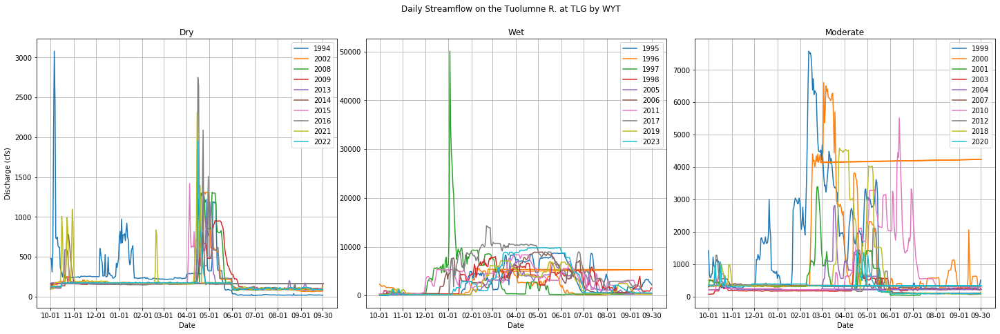

In [22]:
# Select years of certain water year type and overlay the plots for each category over one another
# Sites = 11289650, 11290000
daily_discharge_list = ['obs_11289650', 'obs_11290000', 'fnf_ferc_11289650']
# monthly_discharge = ceff_mean_11289650

WYTs = flowDict['obs_11289650'].WYT.unique()
flowDict_WYT = {}

for discharge in daily_discharge_list:
    year_typeDict = {}
    for year_type in WYTs:
        year_typeDict[year_type] = flowDict[discharge][flowDict[discharge]['WYT'] == year_type]
    flowDict_WYT[discharge] = year_typeDict


# Plot annual data overlaid for each water year type
#plt.rcParams['axes.grid'] = True
fig, ax = plt.subplots(1, len(WYTs), figsize=(20,6))
fig.tight_layout()
fig.suptitle('Daily Streamflow on the Tuolumne R. at TLG by WYT', y=1.08)

for i, year_type in enumerate(WYTs):
    
    # Select the dataframe for the year type and create a list of the WYs in that year_type
    plot_df = flowDict_WYT['obs_11289650'][year_type]
    WYs = flowDict_WYT['obs_11289650'][year_type]['WY'].unique()
    #print(WYs)
    
    # Select the dataframe for each water year
    for WY in WYs:
        selected_df = plot_df[plot_df['WY'] == str(WY)]
        
        # Construct the date range for each WY, including leap years
        #dates = pd.date_range(start=f'{WY-1}-10-01', end=f'{WY}-09-30', freq='D')
        dates = pd.date_range(start=selected_df.index.min(), end=selected_df.index.max(), freq='D')
        #print(selected_df.index.min())
        #print(selected_df.index.max())
        dates = dates.strftime('%m-%d')
        
        if int(WY) in [2000]:
            # Plot streamflow for each year type
            ax[i].plot(dates, selected_df['flow_cfs'], label=WY)
        
            # Set the x-axis ticks and labels
            #ax[i].set_xticks(pd.date_range(start=selected_df.index.min(), end=selected_df.index.max(), freq='MS').strftime('%j').astype(int) - 1) # %j is the DOY
            #ax[i].set_xticklabels(pd.date_range(start=selected_df.index.min(), end=selected_df.index.max(), freq='MS').strftime('%b')) # %b abbreviated month names
        
            ax[i].set_xticks([0, 31, 61, 92, 123, 151, 182, 212, 243, 273, 304, 335, 364]) # days of the year at the start of months
        
            ax[i].set_xlabel('Date')
            ax[0].set_ylabel('Discharge (cfs)')
            ax[i].set_title(year_type)
            ax[i].legend(loc='upper right', fontsize='medium')  
        
        else: 
            # Plot streamflow for each year type
            ax[i].plot(dates, selected_df['flow_cfs'], label=WY)
        
            # Set the x-axis ticks and labels
            #ax[i].set_xticks(pd.date_range(start=selected_df.index.min(), end=selected_df.index.max(), freq='MS').strftime('%j').astype(int) - 1) # %j is the DOY
            #ax[i].set_xticklabels(pd.date_range(start=selected_df.index.min(), end=selected_df.index.max(), freq='MS').strftime('%b')) # %b abbreviated month names
        
            ax[i].set_xticks([0, 31, 61, 92, 123, 151, 182, 212, 243, 273, 304, 335, 364]) # days of the year at the start of months
        
            ax[i].set_xlabel('Date')
            ax[0].set_ylabel('Discharge (cfs)')
            ax[i].set_title(year_type)
            ax[i].legend(loc='upper right', fontsize='medium')  
    
#plt.legend()   
file_name = '../results/figures/timeseries/streamflow/'+selected_sites+'/water_year_type_comparison_TNC_TLG.png'
plt.savefig(file_name, bbox_inches="tight")
plt.show()

# Identify maximum and minimum flows for each day of year ???
# Fix leap years !!

In [23]:
 # Percent of years with HMF by WYT
HMFyrDict = {}
year_types = ['Dry', 'Moderate', 'Wet']
#daily_discharge_list = ['obs_11289650', 'obs_11290000']
daily_discharge_list = ['obs_11289650']
pctHMFbyWY = pd.DataFrame()
nmbrHMFbyWY = pd.DataFrame()
totalnmbryr = pd.DataFrame()

for year_type in year_types:
    
    PctYearWithHMFList = []
    NmbrYearWithHMFList = []
    TotalNmbrYearList = []
    
    #for flow_type in flow_types:
    for discharge in daily_discharge_list:
        discharge_daily = flowDict[discharge]
        HMFyears = discharge_daily.loc[discharge_daily['HMF_cfs'] != 0].WY.unique()
        start_year_site = discharge_daily.WY[0]
        
        NmbrYearWithHMF = 0
        PctYearWithHMF = 0
        TotalNmbrYear = 0
        noHMFyrs = 0
        
        for year in WYT_df.loc[WYT_df['WYT'] == year_type]['WY'][start_year_site+'-01-01':]:
            if year in HMFyears:
                #HMFyrDict
                pass
            else:
                #print(yearType, site_id, year)
                noHMFyrs += 1
        PctYearWithHMF = (len(WYT_df.loc[WYT_df['WYT'] == year_type]['WY'][start_year_site+'-01-01':]) - noHMFyrs) / (len(WYT_df.loc[WYT_df['WYT'] == year_type]['WY'][start_year+'-01-01':])) * 100
        PctYearWithHMFList.append(PctYearWithHMF)
        TotalNmbrYear = len(WYT_df.loc[WYT_df['WYT'] == year_type]['WY'][start_year_site+'-01-01':])
        TotalNmbrYearList.append(TotalNmbrYear)
        NmbrYearWithHMF = len(WYT_df.loc[WYT_df['WYT'] == year_type]['WY'][start_year_site+'-01-01':]) - noHMFyrs
        NmbrYearWithHMFList.append(NmbrYearWithHMF)
        
    pctHMFbyWY[year_type] = PctYearWithHMFList
    nmbrHMFbyWY[year_type] = NmbrYearWithHMFList
    totalnmbryr[year_type] = TotalNmbrYearList

nmbrHMFbyWY['flow_type'] = daily_discharge_list
nmbrHMFbyWY = nmbrHMFbyWY.set_index('flow_type')
nmbrHMFbyWY['All'] = nmbrHMFbyWY[list(nmbrHMFbyWY.columns)].sum(axis=1)
#nmbrHMFbyWY.to_csv('results/tables/WY/Tuol/nmbrHMFbyWY_'+selected_threshold+'_'+selected_record+'_'+selected_sites+'.csv')
print(nmbrHMFbyWY)

totalnmbryr['flow_type'] = daily_discharge_list
totalnmbryr = totalnmbryr.set_index('flow_type')
totalnmbryr['All'] = totalnmbryr[list(totalnmbryr.columns)].sum(axis=1)
#totalnmbryr.to_csv('results/tables/WY/Tuol/totalnmbryear_'+selected_threshold+'_'+selected_record+'_'+selected_sites+'.csv')
print(totalnmbryr)

pctHMFbyWY['flow_type'] = daily_discharge_list
pctHMFbyWY = pctHMFbyWY.set_index('flow_type')
pctHMFbyWY['All'] = nmbrHMFbyWY['All'] / totalnmbryr['All'] * 100
#pctHMFbyWY.to_csv('results/tables/WY/Tuol/pctHMFbyWY_'+selected_threshold+'_'+selected_record+'_'+selected_sites+'.csv')
print(pctHMFbyWY)

              Dry  Moderate  Wet  All
flow_type                            
obs_11289650    0         4   10   14
              Dry  Moderate  Wet  All
flow_type                            
obs_11289650   10        10   10   30
              Dry  Moderate    Wet        All
flow_type                                    
obs_11289650  0.0      40.0  100.0  46.666667


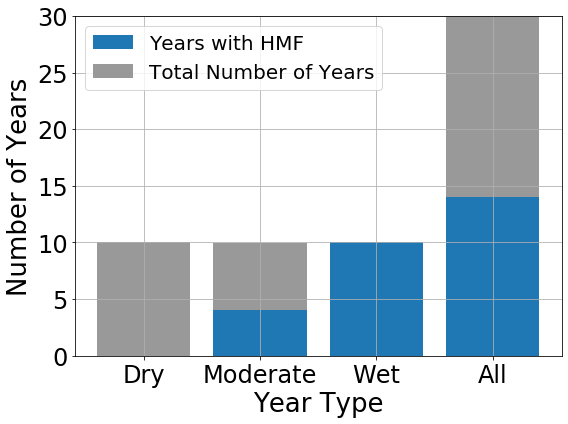

In [24]:
# Bar plots of years with HMF

plt.rcParams['axes.grid'] = False

nmbrHMFbyWY_trans = nmbrHMFbyWY.transpose()
totalnmbryr_trans = totalnmbryr.transpose()
pctHMFbyWY_trans = pctHMFbyWY.transpose()
labels=['Dry', 'Moderate', 'Wet', 'All']
    
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 6), sharey = True)
for i, discharge in enumerate(daily_discharge_list):
    
    flow_df = pd.DataFrame()
    flow_df['HMFyr'] = nmbrHMFbyWY_trans[discharge]
    flow_df['noHMFyr'] = totalnmbryr_trans[discharge] - nmbrHMFbyWY_trans[discharge]
#     ax[i].bar(labels, flow_df['HMFyr'], color='blue')
#     ax[i].bar(labels, flow_df['noHMFyr'], bottom = flow_df['HMFyr'], color='grey')
    ax.bar(labels, flow_df['HMFyr'], color='C0')
    ax.bar(labels, flow_df['noHMFyr'], bottom = flow_df['HMFyr'], color='grey', alpha=0.8)
    
    #sns.barplot(x=sites, y=yearType, data=df_test, ax=ax)
    #ax = df_test.plot(kind='bar', stacked=True, title='%s: Number of Years with HMFs' %site_id)
    #ax[i].set_ylabel('Number of Years')
    #plt.ylabel('Number of Years')
    
#     ax[i].set_xticklabels(labels=['Dry', 'Moderate', 'Wet', 'All'], rotation=0, fontsize=16)
#     #ax[i].set_yticklabels(fontsize=16)
#     ax[i].legend(['Years with HMF', 'Years with No HMF'], fontsize=16)
#     ax[i].set_title('Flow type: %s' %flow_type, fontsize=20)
#     ax[i].set_ylim(0, 30)
#     ax2=ax[i].twinx()
    ax.set_xticklabels(labels=['Dry', 'Moderate', 'Wet', 'All'], rotation=0, fontsize=24)
    #ax[i].set_yticklabels(fontsize=16)
    ax.grid()
    ax.set_ylim(0, 30)
    #ax2=ax.twinx()
    
    #ax2.set_ylim(0, 100)
    #ax2.tick_params(axis='y', labelsize=14)

ax.set_xlabel('Year Type', fontsize=26)    
ax.set_ylabel('Number of Years', fontsize=26)
ax.tick_params(axis='y', labelsize=24)
#ax2.set_ylabel('Percent of All Years that have HMF(%)', fontsize=14)

ax.legend(['Years with HMF', 'Total Number of Years'], fontsize=20)
#ax.set_title('Frequnecy of HMFs by Water Year Type', fontsize=28)
#plt.grid()
plt.tight_layout()

plt.savefig('../results/figures/WY/Tuol/years_with_HMF_30yr_DMW.png', bbox_inches="tight")
plt.show()

## Timeseries

Envrionmental flows (daily 40% unimpaired with FERC)

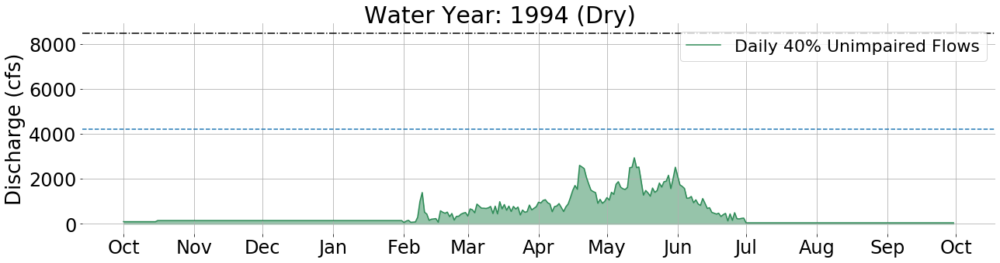

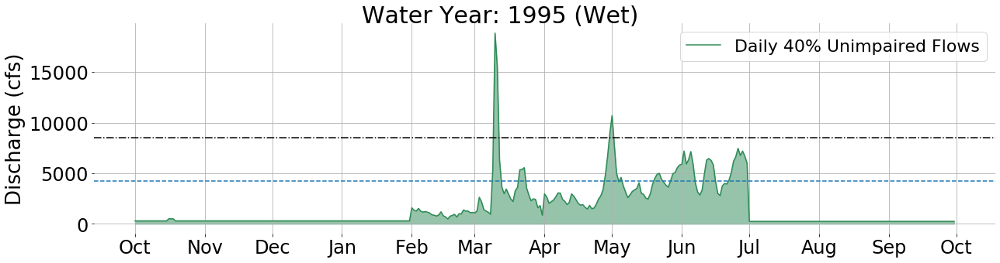

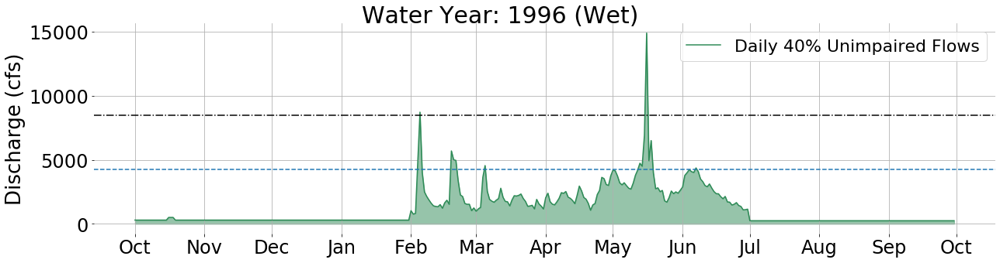

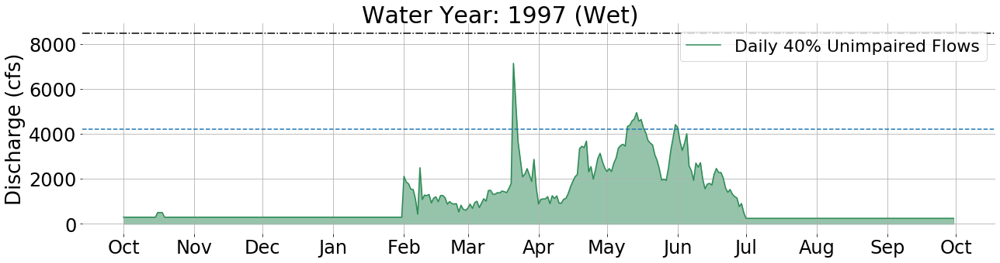

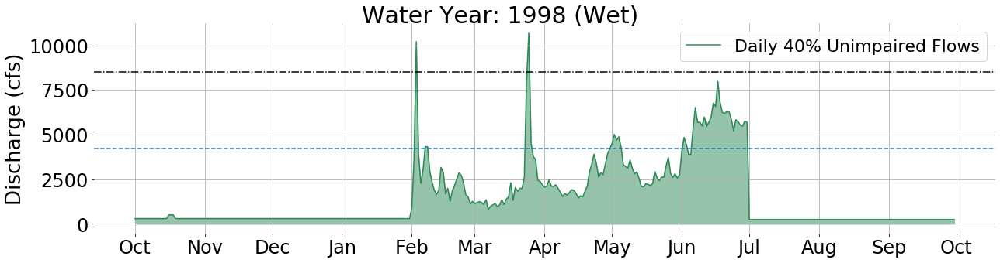

...

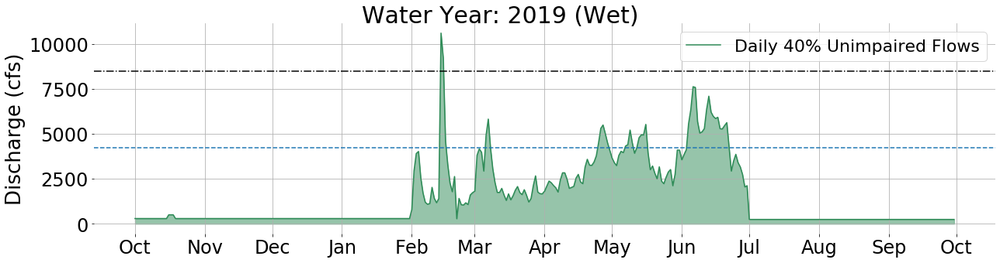

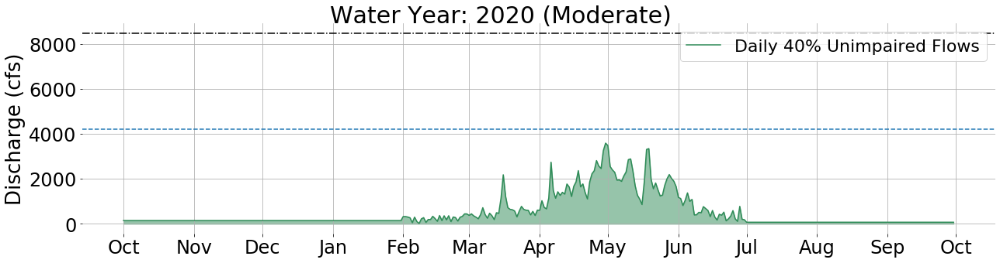

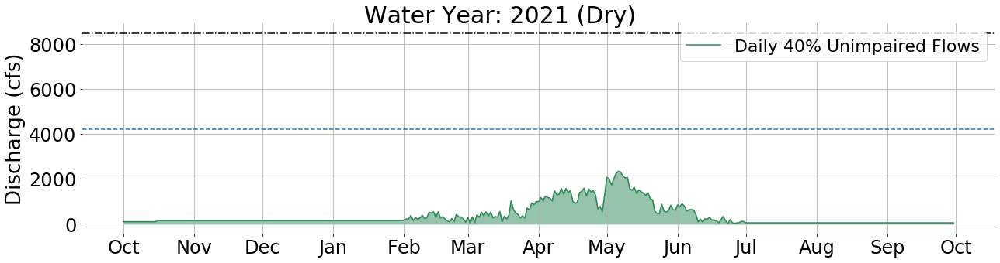

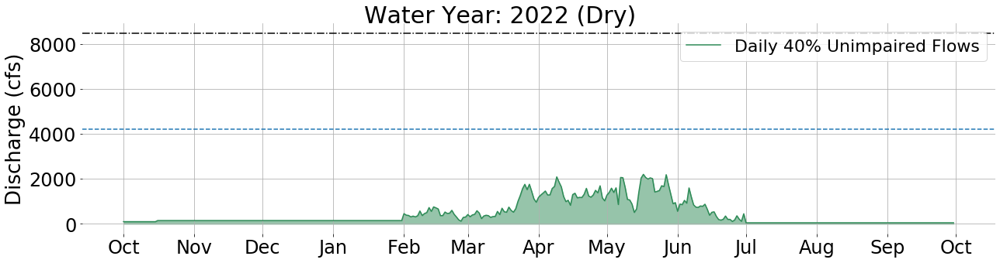

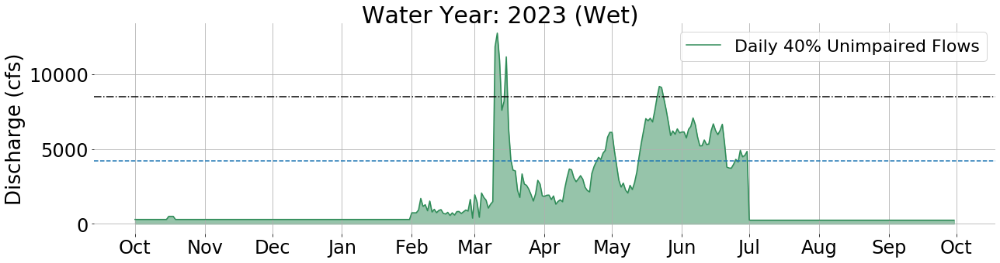

In [35]:
# 40% unimpaired flows with FERC
# Overlay plots of daily discharge for: 
# 1. Observed flows (TLG and Modesto)
# 2. 40% FNF with FERC
# 3. CEFF at TLG

cfs_to_maf = 60 * 60 * 24 / 43560 / 1e6

flowDict['obs_11289650']['HMF_cfs_plot'] = flowDict['obs_11289650']['HMF_cfs'] + thresholds_flowDict[11289650][selected_threshold]
flowDict['obs_11290000']['HMF_cfs_plot'] = flowDict['obs_11290000']['HMF_cfs'] + thresholds_flowDict[11290000][selected_threshold]

#sites = [11289650, 11290000] # Tuolumne R Bl Lagrange Dam Nr Lagrange CA, Tuolumne R at Modesto
#site_id = 11289650
WYs = flowDict['obs_11289650']['WY'].unique()
color_list = ['C0', 'C1']
plt.rcParams['axes.grid'] = True

for i, WY in enumerate(WYs):
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(18,6))
    
#     # Plot daily streamflow for each gage
#     for j, site_id in enumerate(sites):
        
#         temp_df = flowDict['obs_'+str(site_id)]
#         selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
#         ax.plot(selected_df['flow_cfs'], label=f'Observed Streamflow (USGS ID: {site_id})')
#         #ax.plot(selected_df['flow_cfs']*cfs_to_maf, label=f'Site ID = {site_id}')
        
#         # Plot 90th percentile threshold for each gage
#         ax.axhline(y = thresholds_flowDict[site_id][selected_threshold][int(site_id)], color=color_list[j], linestyle='--', label=f'90th Percentile (USGS ID: {site_id})')
     
#     # Plot daily streamflow for singular gauge
#     temp_df = flowDict['obs_'+str(site_id)]
#     selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
#     ax.plot(selected_df['flow_cfs'], label=f'Observed')
    
#     # Plot HMF flows as shaded
#     temp_df = flowDict['obs_'+str(site_id)]
#     selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
#     ax.fill_between(x=selected_df.index, y1=thresholds_flowDict[11289650]['p90'][11289650], y2= selected_df['HMF_cfs_plot'], 
#                 color='lightblue', alpha=0.8, label='Recharge Flows')
    
    # Plot 40% Unimpaired with FERC daily streamflow    
    selected_df = fnf_ferc_11289650[fnf_ferc_11289650['WY'] == WY]
    ax.plot(selected_df['flow_cfs'], color='seagreen', label='Daily 40% Unimpaired Flows')
    ax.fill_between(selected_df['flow_cfs'].index, selected_df['flow_cfs'], color='seagreen', alpha=0.5)
    #ax.plot(selected_df['flow_cfs']*cfs_to_maf, label='40% FNF with FERC')
    
#     # Plot water rights allocations
#     selected_df = diversions_monthly[diversions_monthly['WY'] == WY]
#     ax.plot(selected_df['flow_cfs'], color='coral', label='Water Rights Allocations', alpha=0.9)
    
#     # Plot FNF values (The Nature Conservancy)
#     selected_df = ceff_mean_11289650[ceff_mean_11289650['WY'] == WY]
#     ax.plot(selected_df['flow_cfs'], label='FNF at TLG (TNC)')
    
    # Plot 90th percentile threshold for each gage
    ax.axhline(y=thresholds_flowDict[11289650][selected_threshold], color='C0', linestyle='--')#, label=f'90th Percentile')
    
    # Plot flood capacity 
    ax.axhline(y=8500, color='black', linestyle='-.')#, label='Flood Capacity')

    # Plot legend
    ax.legend(fontsize=22)
    
    # Plot month names instead of numerical dates
    plt.gca().xaxis.set_major_locator(MonthLocator())
    plt.gca().xaxis.set_major_formatter(DateFormatter('%b'))  # %b for month abbreviation
    
    # Add title to plot
    fig.suptitle(f'Water Year: {WY} ({WYT_1994_2023[i]})', fontsize=30)
    
    # Edit tick and axis properties
    ax.tick_params(axis='both', which='major', labelsize=24)
    #ax.set_ylabel(f'Discharge (MAF/day)')
    ax.set_ylabel(f'Discharge (cfs)', fontsize=26)
    #ax.set_xlabel(f'Date', fontsize=18)
    
    # Remove border
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    
    #ax.set_ylabel(f'Discharge (MAF/day)')
    plt.tight_layout(rect=[0, 0.20, 1, 0.95])
    file_name = 'C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\results\\figures\\timeseries\\streamflow\\Tuol\\env_flows\\tuol_unimp'+WY+'.png'
    plt.savefig(file_name, bbox_inches="tight")
    plt.show()

Observed streamflow with HMF shaded

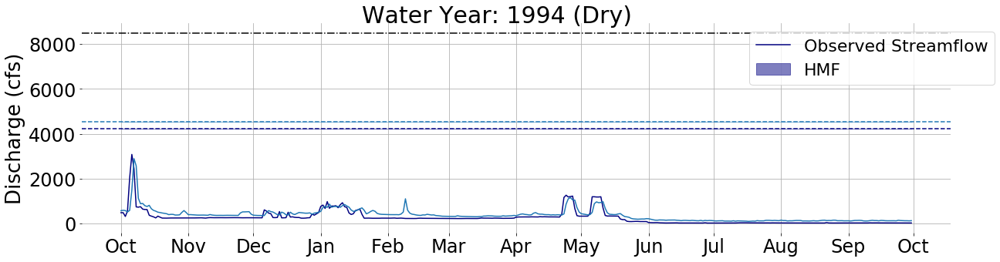

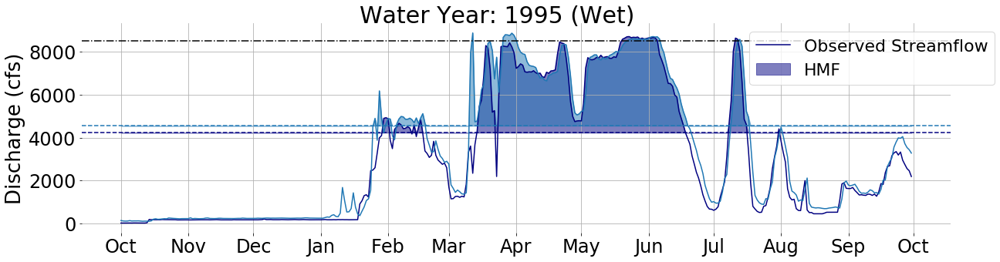

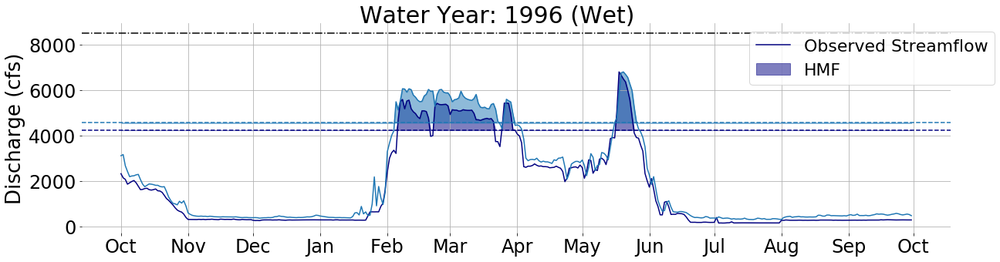

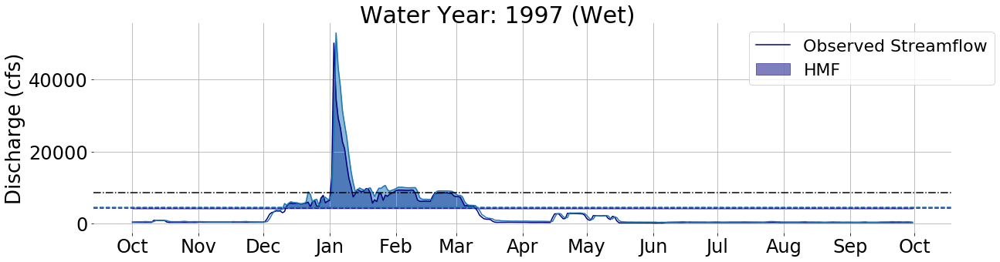

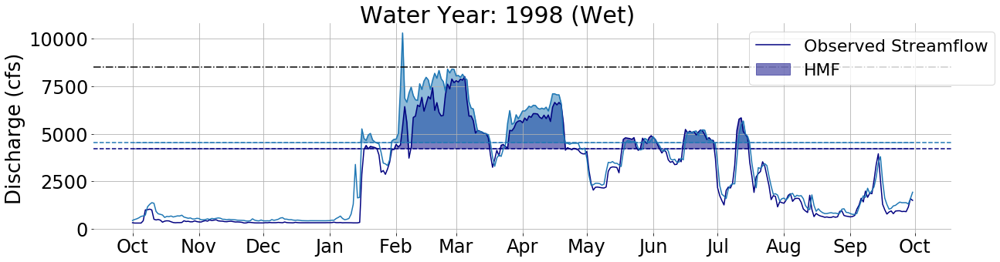

...

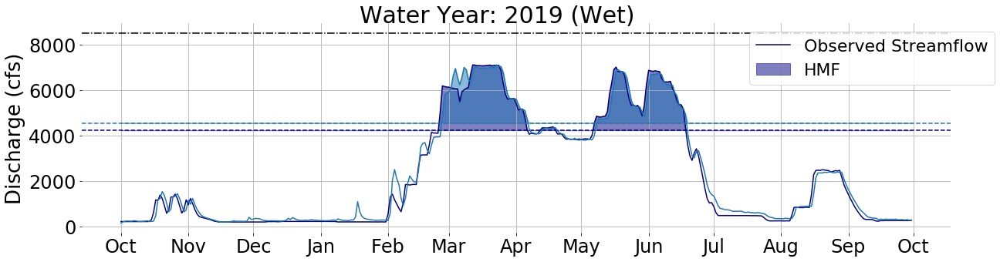

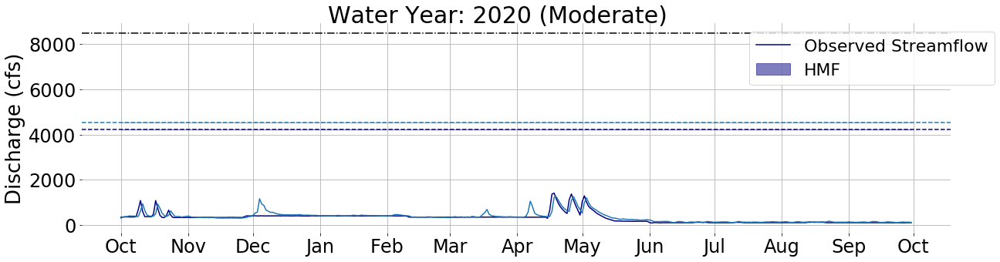

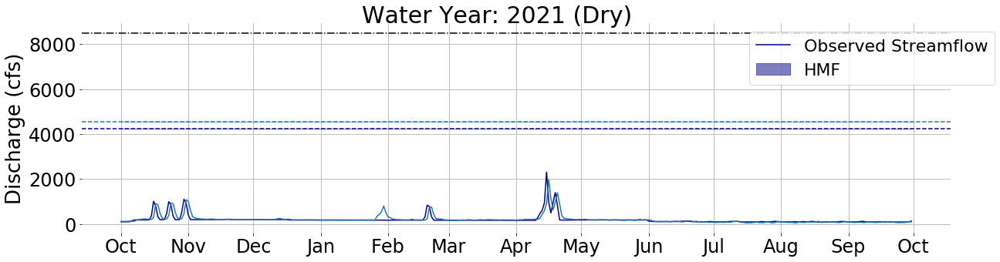

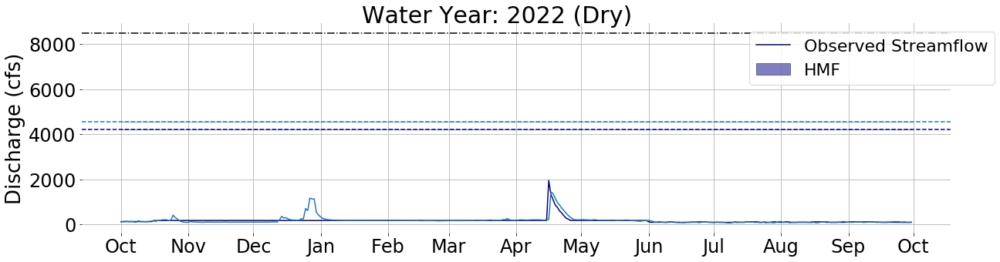

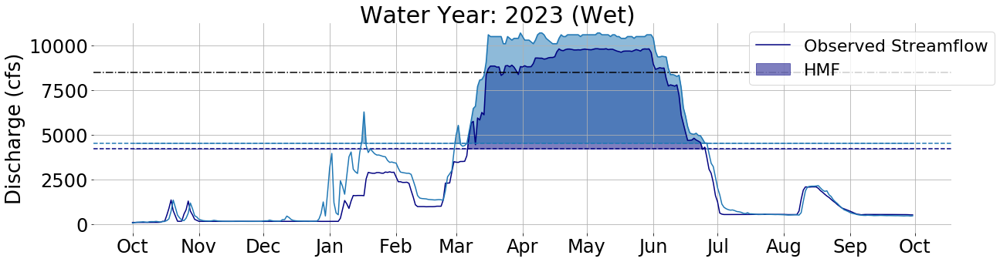

In [36]:
# Observed streamflow and HMF

cfs_to_maf = 60 * 60 * 24 / 43560 / 1e6

flowDict['obs_11289650']['HMF_cfs_plot'] = flowDict['obs_11289650']['HMF_cfs'] + thresholds_flowDict[11289650][selected_threshold]
flowDict['obs_11290000']['HMF_cfs_plot'] = flowDict['obs_11290000']['HMF_cfs'] + thresholds_flowDict[11290000][selected_threshold]

#sites = [11289650, 11290000] # Tuolumne R Bl Lagrange Dam Nr Lagrange CA, Tuolumne R at Modesto
#site_id = 11289650
site_name = ['La Grange (Upstream)', 'Modesto (Downstream)']

WYs = flowDict['obs_11289650']['WY'].unique()
color_list = ['navy', 'C0']
plt.rcParams['axes.grid'] = True

for i, WY in enumerate(WYs):
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(18, 6))
    
    # Plot daily streamflow for each gage
#     for j, site_id in enumerate(sites):
        
#         temp_df = flowDict['obs_'+str(site_id)]
#         selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
#         ax.plot(selected_df['flow_cfs'], color=color_list[j]) #label=f'Observed Streamflow ({site_name[j]})') # (USGS ID: {site_id})
#         #ax.plot(selected_df['flow_cfs']*cfs_to_maf, label=f'Site ID = {site_id}')
     
    # Plot daily streamflow for singular gauge
    temp_df = flowDict['obs_11289650']
    selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
    ax.plot(selected_df['flow_cfs'], color='navy', label=f'Observed Streamflow')
    
    # Plot HMF flows as shaded
    temp_df = flowDict['obs_11289650']
    selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
    ax.fill_between(x=selected_df.index, y1=thresholds_flowDict[11289650][selected_threshold], y2= selected_df['HMF_cfs_plot'], 
                color='navy', alpha=0.5, label=f'HMF')

    # Plot 90th percentile threshold for each gage
    ax.axhline(y = thresholds_flowDict[11289650][selected_threshold], color=color_list[0], linestyle='--')#, label=f'90th Percentile ({site_name[j]})')
    
    # Plot daily streamflow for singular gauge
    temp_df = flowDict['obs_11290000']
    selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
    ax.plot(selected_df['flow_cfs'], color='C0')
    
    # Plot HMF flows as shaded
    temp_df = flowDict['obs_11290000']
    selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
    ax.fill_between(x=selected_df.index, y1=thresholds_flowDict[11290000][selected_threshold], y2= selected_df['HMF_cfs_plot'], 
                color='C0', alpha=0.5) #label=f'HMF ({site_name[j]})')

    # Plot 90th percentile threshold for each gage
    ax.axhline(y = thresholds_flowDict[11290000][selected_threshold], color=color_list[1], linestyle='--')#, label=f'90th Percentile ({site_name[j]})')
    
#     # Plot 40% Unimpaired with FERC daily streamflow    
#     selected_df = fnf_ferc_11289650[fnf_ferc_11289650['WY'] == WY]
#     ax.plot(selected_df['flow_cfs'], color='seagreen', label='Daily 40% Unimpaired Flows')
#     #ax.plot(selected_df['flow_cfs']*cfs_to_maf, label='40% FNF with FERC')
    
#     # Plot water rights allocations
#     selected_df = diversions_monthly[diversions_monthly['WY'] == WY]
#     ax.plot(selected_df['flow_cfs'], color='coral', label='Water Rights Allocations', alpha=0.9)
    
#     # Plot FNF values (The Nature Conservancy)
#     selected_df = ceff_mean_11289650[ceff_mean_11289650['WY'] == WY]
#     ax.plot(selected_df['flow_cfs'], label='FNF at TLG (TNC)')
    
    # Plot 90th percentile threshold for each gage
    # ax.axhline(y=thresholds_flowDict[11289650]['p90'][11289650], color='black', linestyle='--', label=f'90th Percentile')
    
    # Plot flood capacity 
    ax.axhline(y=8500, color='black', linestyle='-.')#, label='Flood Capacity')

    # Plot legend
    ax.legend(bbox_to_anchor=(1.06, 1), loc='upper right', fontsize=22)
    
    # Plot month names instead of numerical dates
    plt.gca().xaxis.set_major_locator(MonthLocator())
    plt.gca().xaxis.set_major_formatter(DateFormatter('%b'))  # %b for month abbreviation
    
    # Add title to plot
    fig.suptitle(f'Water Year: {WY} ({WYT_1994_2023[i]})', fontsize=30)
    
    # Edit tick and axis properties
    ax.tick_params(axis='both', which='major', labelsize=24)
    #ax.set_ylabel(f'Discharge (MAF/day)')
    ax.set_ylabel(f'Discharge (cfs)', fontsize=26)
    #ax.set_xlabel(f'Date', fontsize=16)
    
    # Remove border
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    
    #ax.set_ylabel(f'Discharge (MAF/day)')
    plt.tight_layout(rect=[0, 0.20, 1, 0.95])
    file_name = 'C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\results\\figures\\timeseries\\streamflow\\Tuol\\obs_flow\\tuol_obs_flow'+str(site_id)+'_'+WY+'.png'
    plt.savefig(file_name, bbox_inches="tight")
    plt.show()

Overlay of flows (observed with HMF, environmental, water rights)

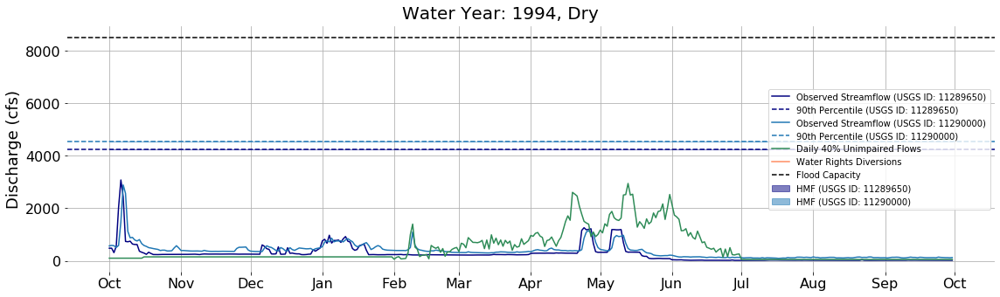

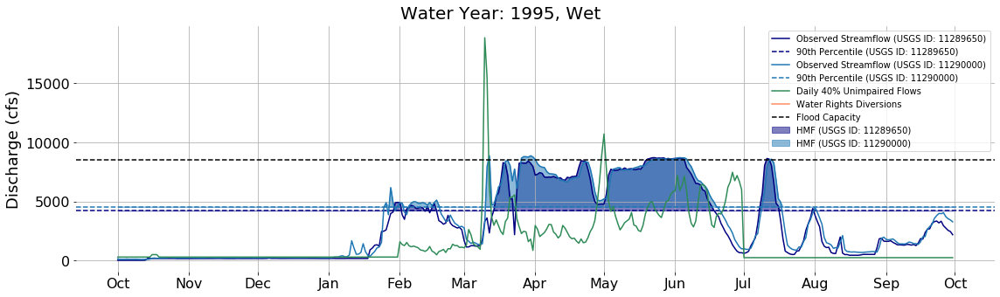

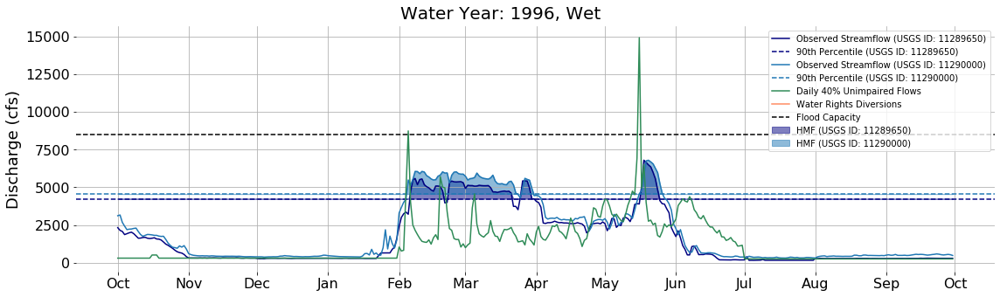

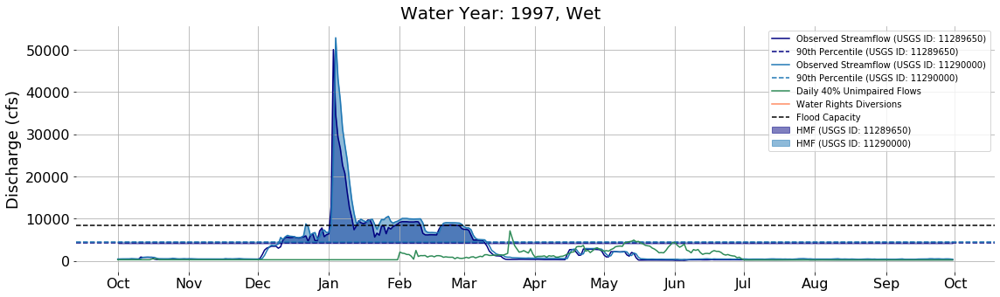

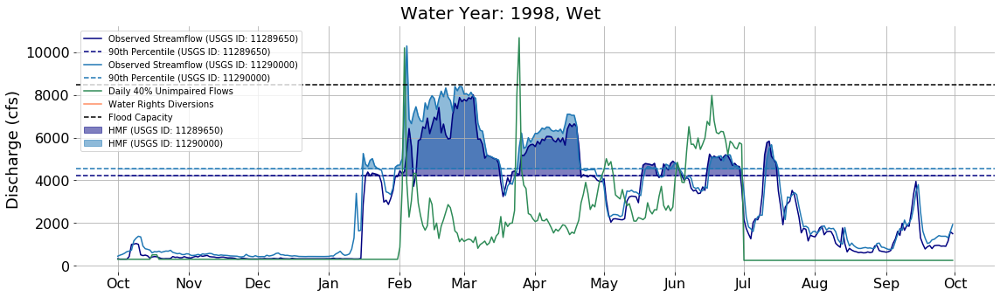

...

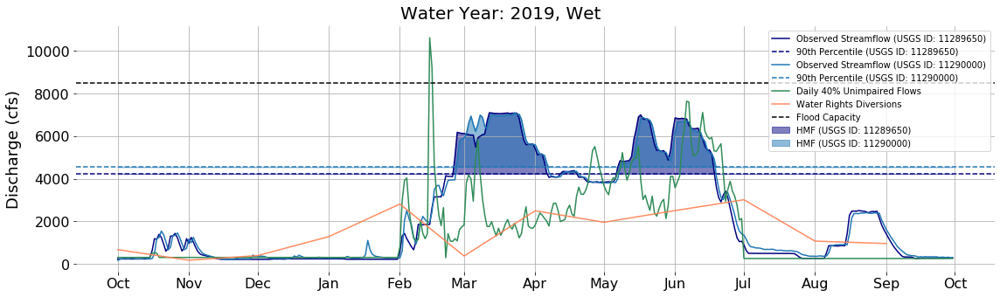

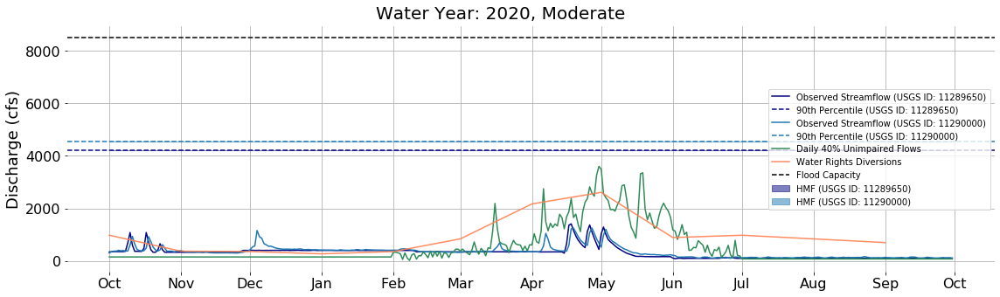

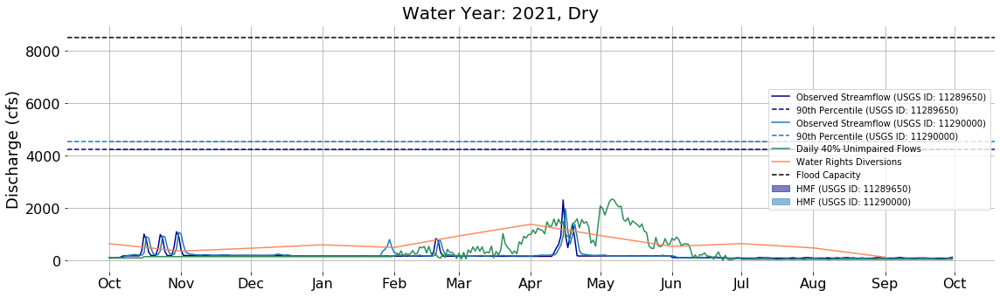

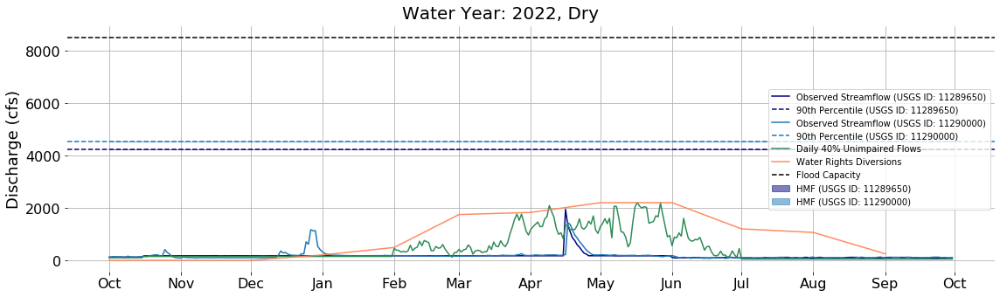

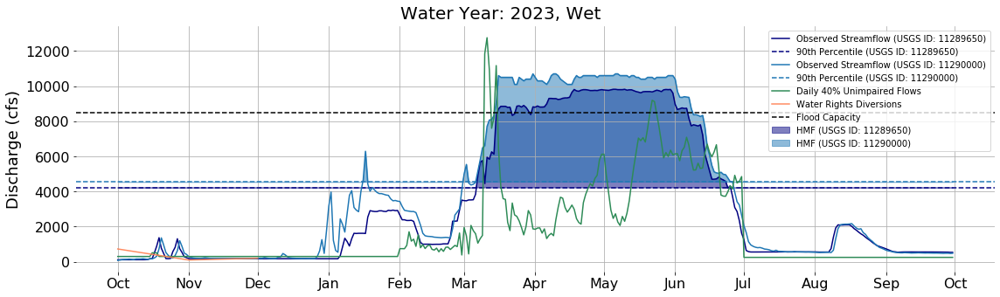

In [37]:
# Overlay plots of daily discharge for: 
# 1. Observed flows (TLG and Modesto)
# 2. 40% FNF with FERC
# 3. CEFF at TLG

cfs_to_maf = 60 * 60 * 24 / 43560 / 1e6

#flowDict['obs_11289650']['HMF_cfs_plot'] = flowDict['obs_11289650']['HMF_cfs'] + thresholds_flowDict[11289650]['p90'][11289650]
#flowDict['obs_11290000']['HMF_cfs_plot'] = flowDict['obs_11290000']['HMF_cfs'] + thresholds_flowDict[11290000]['p90'][11290000]

#sites = [11289650, 11290000] # Tuolumne R Bl Lagrange Dam Nr Lagrange CA, Tuolumne R at Modesto
#site_id = 11289650
WYs = flowDict['obs_11289650']['WY'].unique()
color_list = ['navy', 'C0']
plt.rcParams['axes.grid'] = True

for i, WY in enumerate(WYs):
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(16,6))
    
#     # Plot daily streamflow for each gage
#     for j, site_id in enumerate(sites):
        
#         temp_df = flowDict['obs_'+str(site_id)]
#         selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
#         ax.plot(selected_df['flow_cfs'], label=f'Observed Streamflow (USGS ID: {site_id})')
#         #ax.plot(selected_df['flow_cfs']*cfs_to_maf, label=f'Site ID = {site_id}')
        
#         # Plot 90th percentile threshold for each gage
#         ax.axhline(y = thresholds_flowDict[site_id][selected_threshold][int(site_id)], color=color_list[j], linestyle='--', label=f'90th Percentile (USGS ID: {site_id})')
     
# #     # Plot daily streamflow for singular gauge
# #     temp_df = flowDict['obs_'+str(site_id)]
# #     selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
# #     ax.plot(selected_df['flow_cfs'], label=f'Observed')
    
#     # Plot HMF flows as shaded
#     temp_df = flowDict['obs_'+str(site_id)]
#     selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
#     ax.fill_between(x=selected_df.index, y1=thresholds_flowDict[11289650]['p90'][11289650], y2= selected_df['HMF_cfs_plot'], 
#                 color='lightblue', alpha=0.8, label='Recharge Flows')
    
    # Plot daily streamflow for each gage
    for j, site_id in enumerate(sites):
        
        temp_df = flowDict['obs_'+str(site_id)]
        selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
        ax.plot(selected_df['flow_cfs'], color=color_list[j], label=f'Observed Streamflow (USGS ID: {site_id})')
        #ax.plot(selected_df['flow_cfs']*cfs_to_maf, label=f'Site ID = {site_id}')
        
        # Plot 90th percentile threshold for each gage
        ax.axhline(y = thresholds_flowDict[site_id][selected_threshold], color=color_list[j], linestyle='--', label=f'90th Percentile (USGS ID: {site_id})')
     
#    # Plot daily streamflow for singular gauge
#    temp_df = flowDict['obs_'+str(site_id)]
#    selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
#    ax.plot(selected_df['flow_cfs'], label=f'Observed Streamflow (USGS ID: {site_id})')
    
        # Plot HMF flows as shaded
        temp_df = flowDict['obs_'+str(site_id)]
        selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
        ax.fill_between(x=selected_df.index, y1=thresholds_flowDict[site_id][selected_threshold], y2= selected_df['HMF_cfs_plot'], 
                    color=color_list[j], alpha=0.5, label=f'HMF (USGS ID: {site_id})')
    
    # Plot 40% Unimpaired with FERC daily streamflow    
    selected_df = fnf_ferc_11289650[fnf_ferc_11289650['WY'] == WY]
    ax.plot(selected_df['flow_cfs'], color='seagreen', label='Daily 40% Unimpaired Flows')
    #ax.plot(selected_df['flow_cfs']*cfs_to_maf, label='40% FNF with FERC')
    
    # Plot water rights allocations
    selected_df = div_monthly_subset[div_monthly_subset['WY'] == WY]
    ax.plot(selected_df['flow_cfs'], color='coral', label='Water Rights Diversions', alpha=0.9)
    
#     # Plot FNF values (The Nature Conservancy)
#     selected_df = ceff_mean_11289650[ceff_mean_11289650['WY'] == WY]
#     ax.plot(selected_df['flow_cfs'], label='FNF at TLG (TNC)')
    
    # Plot 90th percentile threshold for each gage
    # ax.axhline(y=thresholds_flowDict[11289650]['p90'][11289650], color='black', linestyle='--', label=f'90th Percentile')
    
    # Plot flood capacity 
    ax.axhline(y=8500, color='black', linestyle='--', label='Flood Capacity')

    # Plot legend
    ax.legend()
    
    # Plot month names instead of numerical dates
    plt.gca().xaxis.set_major_locator(MonthLocator())
    plt.gca().xaxis.set_major_formatter(DateFormatter('%b'))  # %b for month abbreviation
    
    # Add title to plot
    fig.suptitle(f'Water Year: {WY}, {WYT_1994_2023[i]}', fontsize=20)
    
    # Edit tick and axis properties
    ax.tick_params(axis='both', which='major', labelsize=16)
    #ax.set_ylabel(f'Discharge (MAF/day)')
    ax.set_ylabel(f'Discharge (cfs)', fontsize=18)
    #ax.set_xlabel(f'Date', fontsize=16)
    
    # Remove border
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    
    #ax.set_ylabel(f'Discharge (MAF/day)')
    ax.set_ylabel(f'Discharge (cfs)', fontsize=18)
    plt.tight_layout(rect=[0, 0.20, 1, 0.95])
    file_name = 'C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\results\\figures\\timeseries\\streamflow\\Tuol\\gage_comparison\\tuol_all_flows'+WY+'.png'
    plt.savefig(file_name, bbox_inches="tight")
    plt.show()

Hydrograph of 30-year record for all flows (observed with HMF, environmental, water rights)

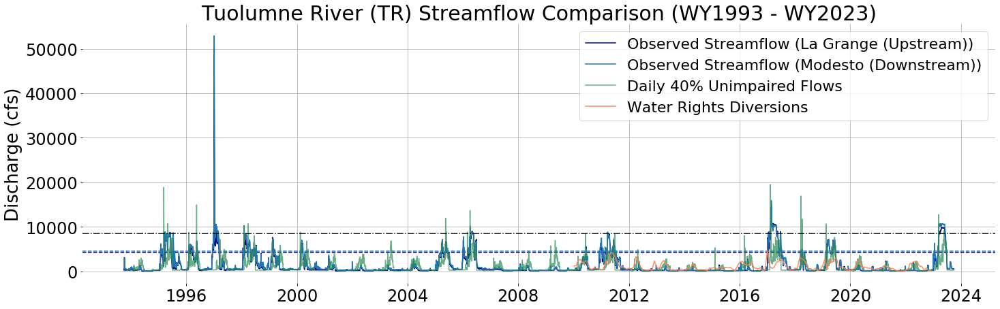

In [38]:
# Hydrograph of 30 years for observed, recharge, unimpaired, and water rights flows

#flowDict['obs']['HMF_cfs_plot'] = flowDict['obs']['HMF_cfs'] + thresholds_flowDict['obs'][selected_threshold][int(site)]

#### All years: 1993-2023 #####
#flow_types = ['obs', 'fnf_ferc']
#labels = ['Observed', 'Daily 40% Unimpaired Flows']
alpha_values = [1, 0.7]
color_list = ['navy', 'C0']
site_names = ['La Grange (Upstream)', 'Modesto (Downstream)']

fig, ax = plt.subplots(figsize=(24,7))
    
# Plot daily streamflow for each gage
for j, site_id in enumerate(sites):

    selected_df = flowDict['obs_'+str(site_id)]
    ax.plot(selected_df['flow_cfs'], color=color_list[j], label=f'Observed Streamflow ({site_names[j]})')
    #ax.plot(selected_df['flow_cfs']*cfs_to_maf, label=f'Site ID = {site_id}')

    # Plot 90th percentile threshold for each gage
    ax.axhline(y = thresholds_flowDict[site_id][selected_threshold], color=color_list[j], linestyle='--') #label=f'90th Percentile (USGS ID: {site_id})')

#    # Plot daily streamflow for singular gauge
#    temp_df = flowDict['obs_'+str(site_id)]
#    selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
#    ax.plot(selected_df['flow_cfs'], label=f'Observed Streamflow (USGS ID: {site_id})')

#     # Plot HMF flows as shaded
#     selected_df = flowDict['obs_'+str(site_id)]
#     ax.fill_between(x=selected_df.index, y1=thresholds_flowDict[site_id]['p90'][site_id], y2= selected_df['HMF_cfs_plot'], 
#                 color=color_list[j], alpha=0.5, label=f'HMF (USGS ID: {site_id})')

# Plot 40% Unimpaired with FERC daily streamflow    
ax.plot(fnf_ferc_11289650['flow_cfs'], color='seagreen', alpha=0.7, label='Daily 40% Unimpaired Flows')
#ax.plot(selected_df['flow_cfs']*cfs_to_maf, label='40% FNF with FERC')

# Plot water rights allocations
ax.plot(div_monthly_subset['flow_cfs'], color='coral', label='Water Rights Diversions', alpha=0.9)

ax.axhline(y=8500, color='black', linestyle='-.')#, label='Flood Capacity')

#ax.set_xlabel('Year', fontsize=24)
ax.set_ylabel('Discharge (cfs)', fontsize=26)
ax.set_title('Tuolumne River (TR) Streamflow Comparison (WY1993 - WY2023)', fontsize=30)
ax.tick_params(axis='both', which='major', labelsize=24)
#ax.set_ylim(0, 32000)

ax.legend(loc='upper right', fontsize=22)
#plt.grid()

# Remove border
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

file_name = '../results/figures/timeseries/streamflow/'+selected_sites+'/compare_daily_flows_1993_2023_full_yaxis.png'
plt.savefig(file_name, bbox_inches="tight")
plt.show()

Plot of all hydrographs for selected start and end date

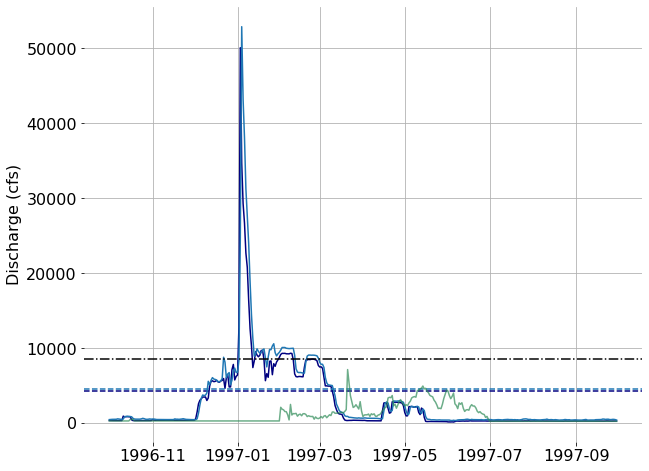

In [39]:
# Hydrograph of selected years for observed, recharge, unimpaired, and water rights flows

#flowDict['obs']['HMF_cfs_plot'] = flowDict['obs']['HMF_cfs'] + thresholds_flowDict['obs'][selected_threshold][int(site)]

#### All years: 1993-2023 #####
#flow_types = ['obs', 'fnf_ferc']
#labels = ['Observed', 'Daily 40% Unimpaired Flows']
alpha_values = [1, 0.7]
color_list = ['navy', 'C0']
site_names = ['TR Bl La Grange (Upstream)', 'TR at Modesto (Downstream)']
start_date_df = pd.to_datetime('1996-10-01')
end_date_df = pd.to_datetime('1997-09-30')

fig, ax = plt.subplots(figsize=(10,8))
    
# Plot daily streamflow for each gage
for j, site_id in enumerate(sites):

    selected_df = flowDict['obs_'+str(site_id)]
    ax.plot(selected_df.loc[start_date_df:end_date_df]['flow_cfs'], color=color_list[j], label=f'Observed Streamflow ({site_names[j]})')
    #ax.plot(selected_df['flow_cfs']*cfs_to_maf, label=f'Site ID = {site_id}')

    # Plot 90th percentile threshold for each gage
    ax.axhline(y = thresholds_flowDict[site_id][selected_threshold], color=color_list[j], linestyle='--') #label=f'90th Percentile (USGS ID: {site_id})')

#    # Plot daily streamflow for singular gauge
#    temp_df = flowDict['obs_'+str(site_id)]
#    selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
#    ax.plot(selected_df['flow_cfs'], label=f'Observed Streamflow (USGS ID: {site_id})')

#     # Plot HMF flows as shaded
#     selected_df = flowDict['obs_'+str(site_id)]
#     ax.fill_between(x=selected_df.index, y1=thresholds_flowDict[site_id]['p90'][site_id], y2= selected_df['HMF_cfs_plot'], 
#                 color=color_list[j], alpha=0.5, label=f'HMF (USGS ID: {site_id})')

# Plot 40% Unimpaired with FERC daily streamflow    
ax.plot(fnf_ferc_11289650.loc[start_date_df:end_date_df]['flow_cfs'], color='seagreen', alpha=0.7, label='Daily 40% Unimpaired Flows')
#ax.plot(selected_df['flow_cfs']*cfs_to_maf, label='40% FNF with FERC')

# Plot water rights allocations
#ax.plot(div_monthly_subset['flow_cfs']['1996-10-01':'1997-09-30'], color='coral', label='Water Rights Diversions', alpha=0.9)

ax.axhline(y=8500, color='black', linestyle='-.')#, label='Flood Capacity')

#ax.set_xlabel('Year', fontsize=24)
ax.set_ylabel('Discharge (cfs)', fontsize=16)
#ax.set_title('Tuolumne River (TR) Streamflow Comparison (WY1993 - WY2023)', fontsize=30)
ax.tick_params(axis='both', which='major', labelsize=16)
#ax.set_ylim(0, 30000)

#ax.legend(loc='upper right', fontsize=22)
#plt.grid()

# Remove border
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

file_name = '../results/figures/timeseries/streamflow/'+selected_sites+'/compare_daily_flows_1997.png'
plt.savefig(file_name, bbox_inches="tight")
plt.show()

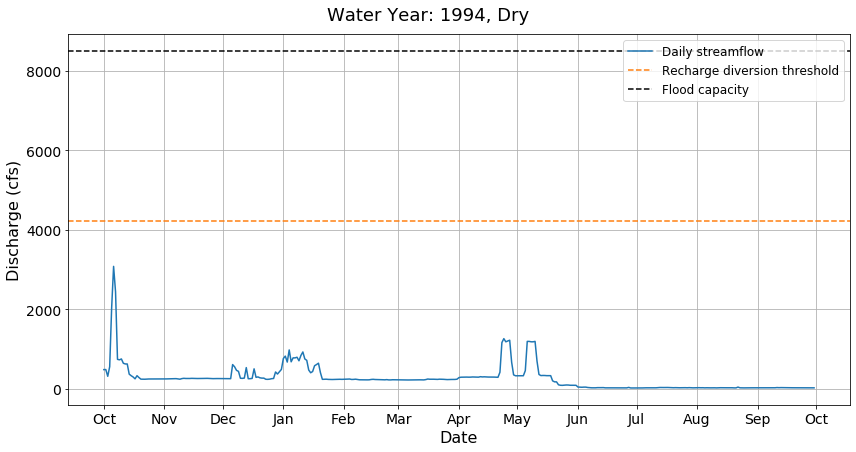

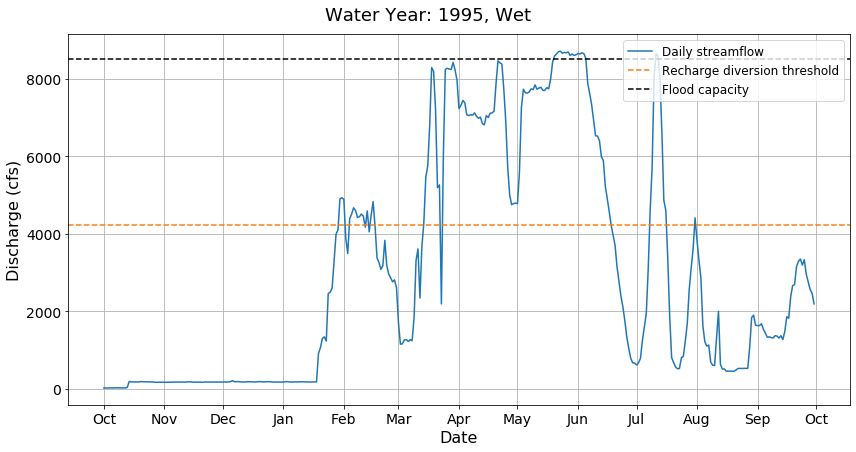

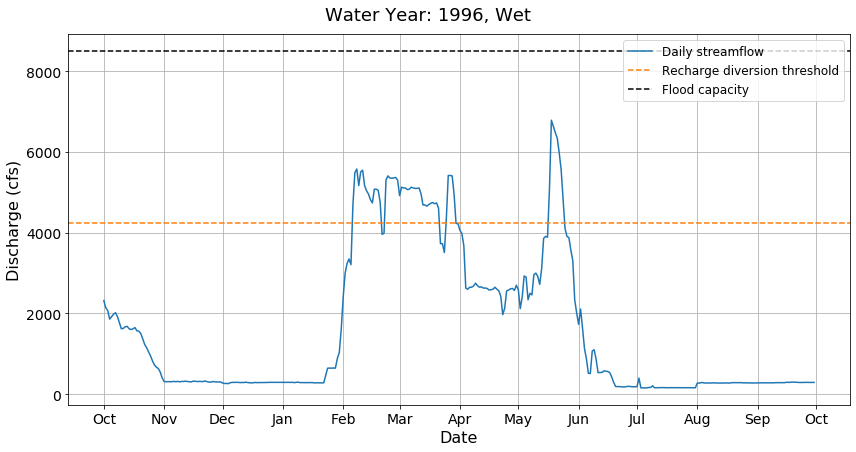

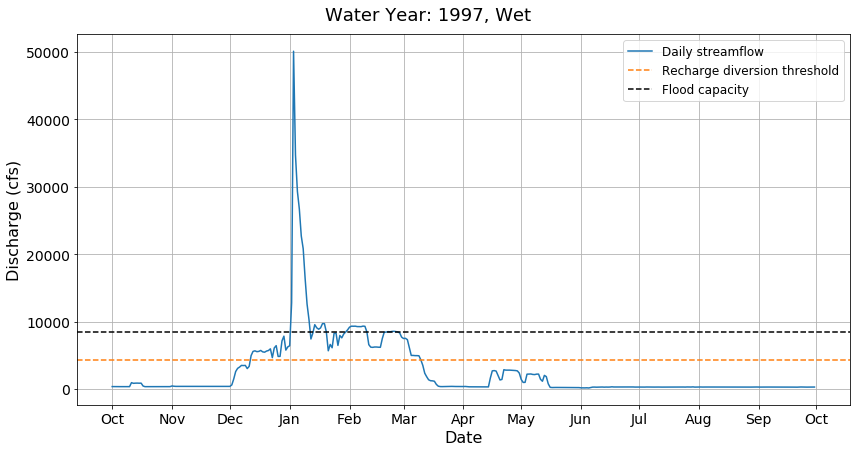

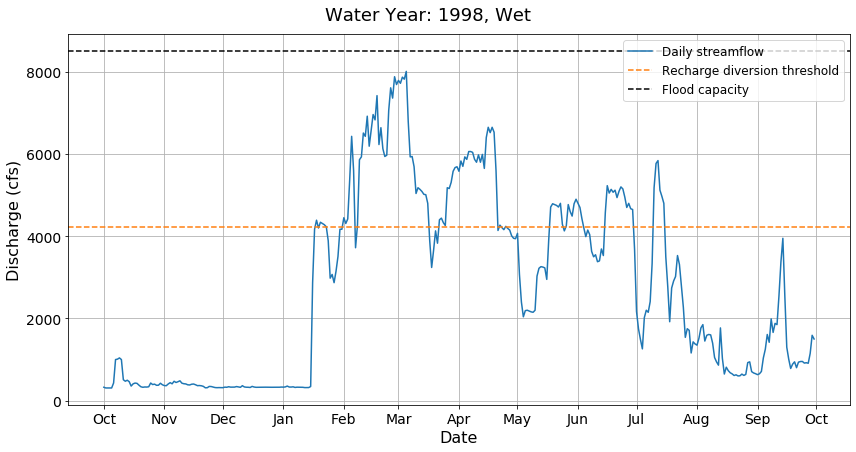

...

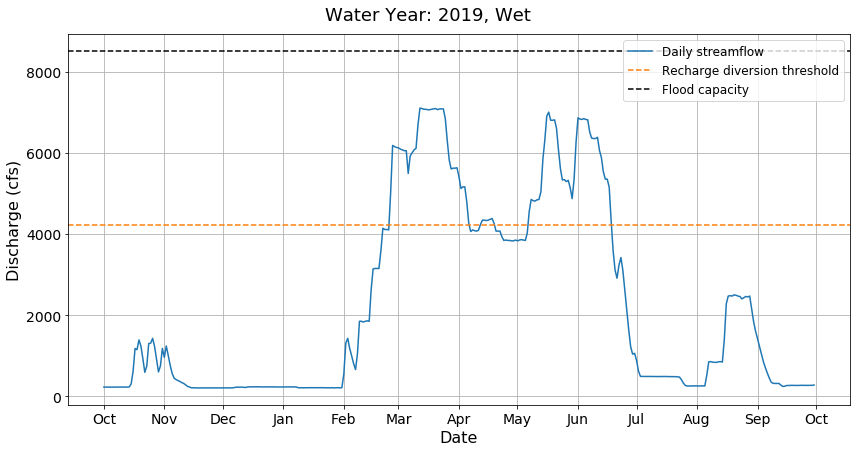

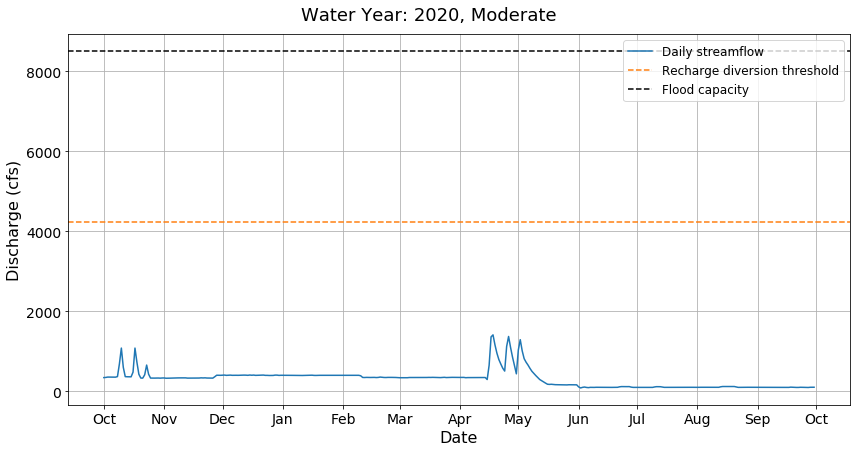

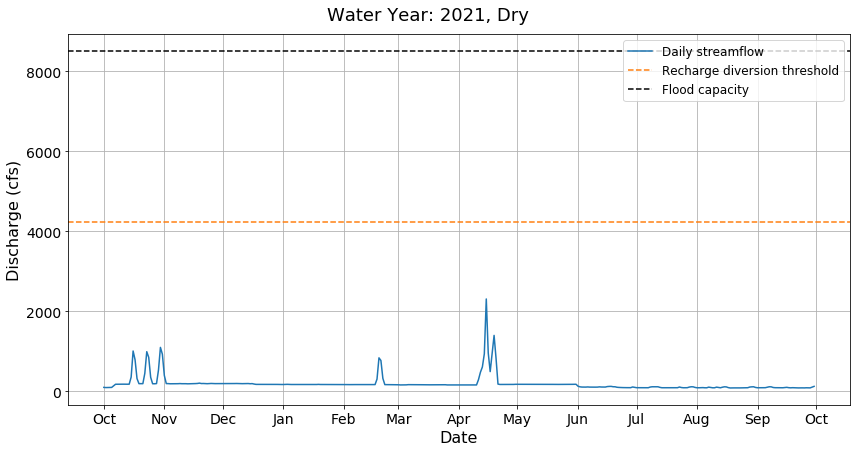

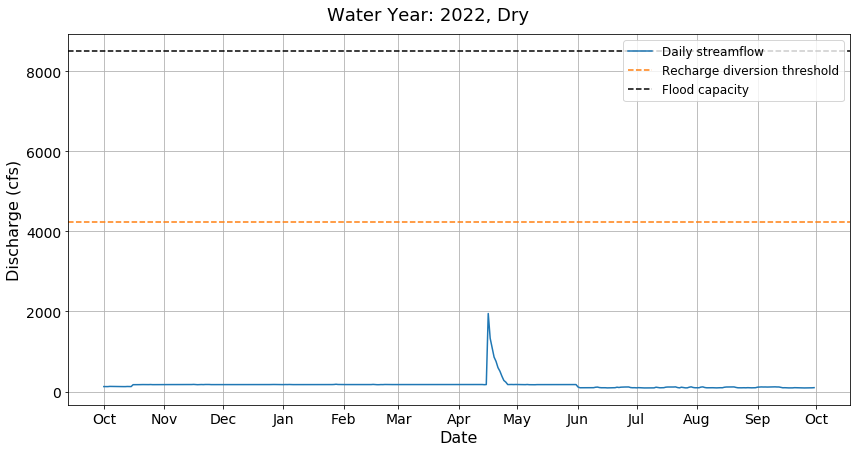

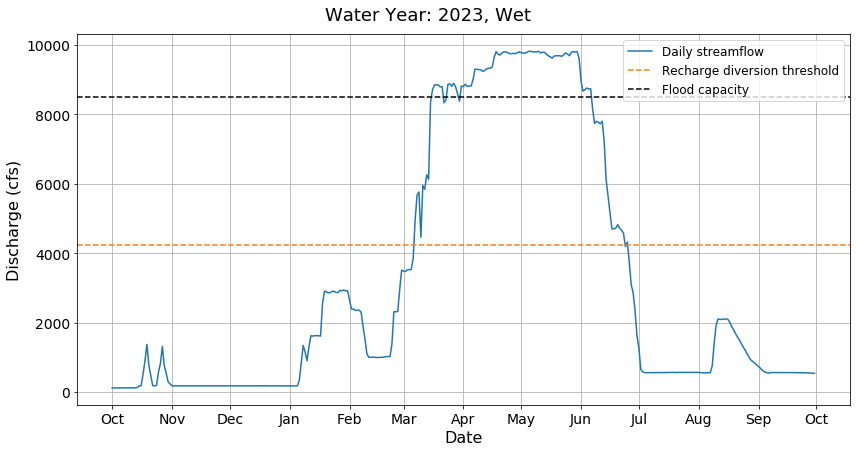

In [40]:
# Observed flows only for presentation

#sites = [11289650, 11290000] # Tuolumne R Bl Lagrange Dam Nr Lagrange CA, Tuolumne R at Modesto
site_id = 11289650

cfs_to_maf = 60 * 60 * 24 / 43560 / 1e6

WYs = flowDict['obs_11289650']['WY'].unique()
color_list = ['C0', 'C1']

plt.rcParams['axes.grid'] = True

for i, WY in enumerate(WYs):
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12,8))
    
    # Plot daily streamflow for selected gage
        
    temp_df = flowDict['obs_'+str(site_id)]
    selected_df = temp_df[temp_df['WY'] == WY] # only select rows associated with WY of each loop
    ax.plot(selected_df['flow_cfs'], label=f'Daily streamflow')
    #ax.plot(selected_df['flow_cfs']*cfs_to_maf, label=f'Site ID = {site_id}')
        
    # Plot 90th percentile threshold for each gage
    ax.axhline(y = thresholds_flowDict[site_id][selected_threshold], color=color_list[j], linestyle='--', label=f'Recharge diversion threshold')
        
#     # Plot 40% Unimpaired with FERC daily streamflow    
#     selected_df = fnf_ferc_11289650[fnf_ferc_11289650['WY'] == WY]
#     ax.plot(selected_df['flow_cfs'], label='40% Unimp. Flows with FERC')
#     #ax.plot(selected_df['flow_cfs']*cfs_to_maf, label='40% FNF with FERC')
    
#     # Plot FNF values (The Nature Conservancy)
#     selected_df = ceff_mean_11289650[ceff_mean_11289650['WY'] == WY]
#     ax.plot(selected_df['flow_cfs'], label='FNF at TLG (TNC)')
    
    # Plot flood capacity 
    ax.axhline(y=8500, color='black', linestyle='--', label='Flood capacity')

    # Plot legend
    ax.legend(loc = 'upper right', fontsize=12)
    
    # Plot month names instead of numerical dates
    plt.gca().xaxis.set_major_locator(MonthLocator())
    plt.gca().xaxis.set_major_formatter(DateFormatter('%b'))  # %b for month abbreviation
    
    # Add title to plot
    fig.suptitle(f'Water Year: {WY}, {WYT_1994_2023[i]}', fontsize=18)
    
    # Edit tick and axis properties
    ax.tick_params(axis='both', which='major', labelsize=14)
    #ax.set_ylabel(f'Discharge (MAF/day)')
    ax.set_ylabel(f'Discharge (cfs)', fontsize=16)
    ax.set_xlabel(f'Date', fontsize=16)
    
    # Save plot
    plt.tight_layout(rect=[0, 0.20, 1, 0.95])
    file_name = 'C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\results\\figures\\timeseries\\streamflow\\Tuol\\gage_comparison\\tuol_obs_only_'+selected_record+'_'+flow_type+'_'+WY+'.png'
    plt.savefig(file_name, bbox_inches="tight")
    plt.show()

In [62]:
# Find the average value of each day across years of a specific WYT and then plot the cumulative sum
# if WYT = wet/mod/dry:
# take the average value of that date

Annual cumulative flow stacked bar plots

In [41]:
# Create dfs for HMF and observed flows on a monthly timestep

# Env flows
fnf_ferc_11289650['datetime'] = pd.to_datetime(fnf_ferc_11289650.index)

# Group by month and sum the values
fnf_ferc_11289650_monthly = fnf_ferc_11289650.groupby(fnf_ferc_11289650['datetime'].dt.to_period("M")).sum()

# Reset the index to get 'month' as a column
fnf_ferc_11289650_monthly.reset_index(inplace=True)
fnf_ferc_11289650_monthly.set_index('datetime', inplace=True)

#fnf_ferc_11289650_monthly

# HMF
flowDict['obs_11289650']['datetime'] = pd.to_datetime(flowDict['obs_11289650'].index)

# Group by month and sum the values
obs_11289650_monthly = flowDict['obs_11289650'].groupby(flowDict['obs_11289650']['datetime'].dt.to_period("M")).sum()

# Reset the index to get 'month' as a column
obs_11289650_monthly.reset_index(inplace=True)
obs_11289650_monthly.set_index('datetime', inplace=True)

obs_11289650_monthly.head()

,flow_cfs,DOY,DOHY,HMF_cfs,HMF_cfs_plot
datetime,,,,,
1993-10,18205.0,8959,496,0.0,131130.0
1993-11,7577.0,9585,1395,0.0,126900.0
1993-12,10184.0,10850,2387,0.0,131130.0
1994-01,16266.0,496,3317,0.0,131130.0
1994-02,6373.0,1274,3822,0.0,118440.0


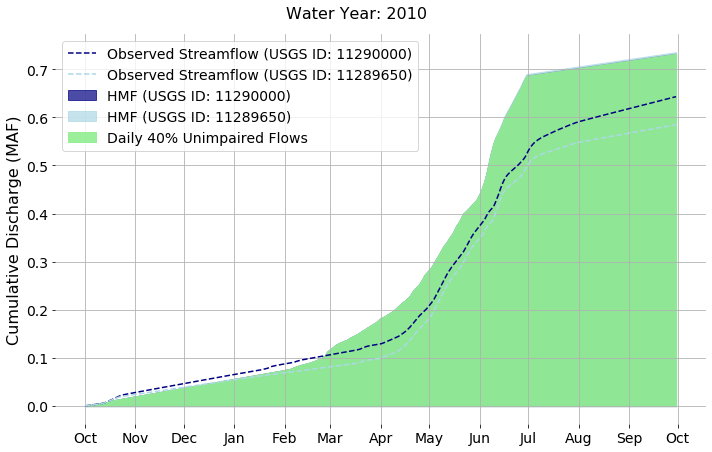

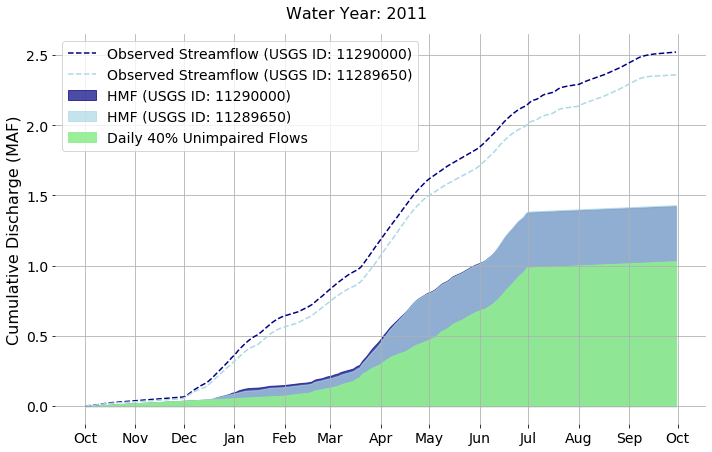

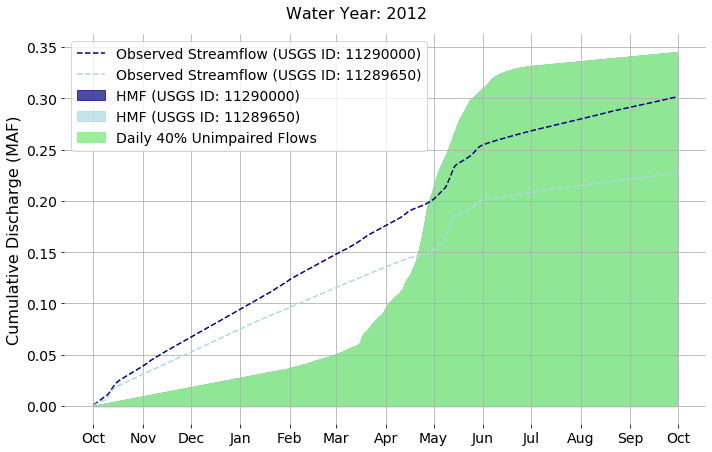

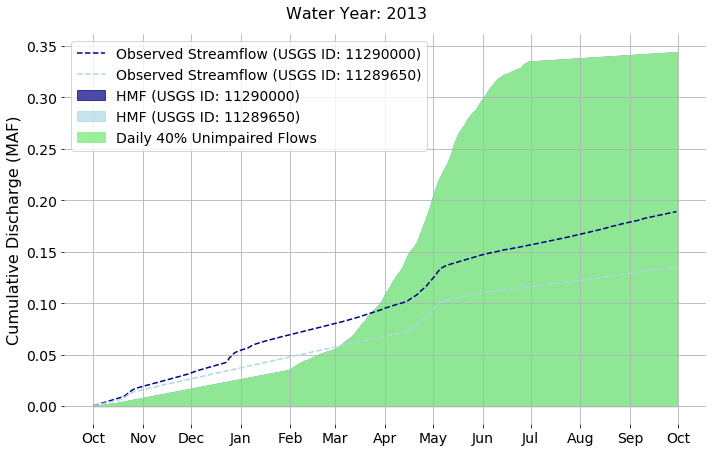

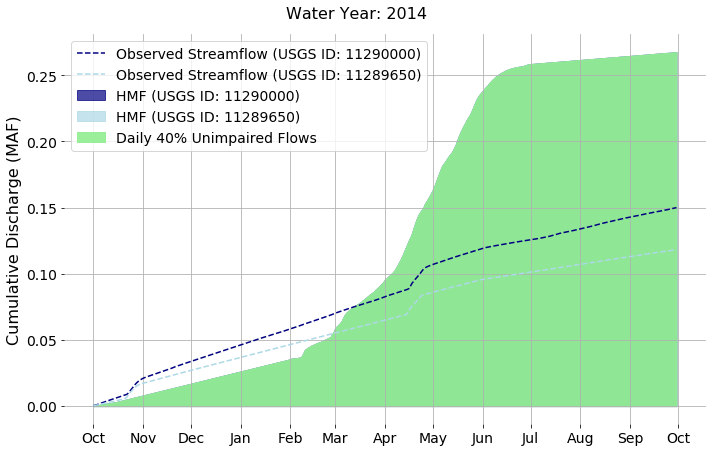

...

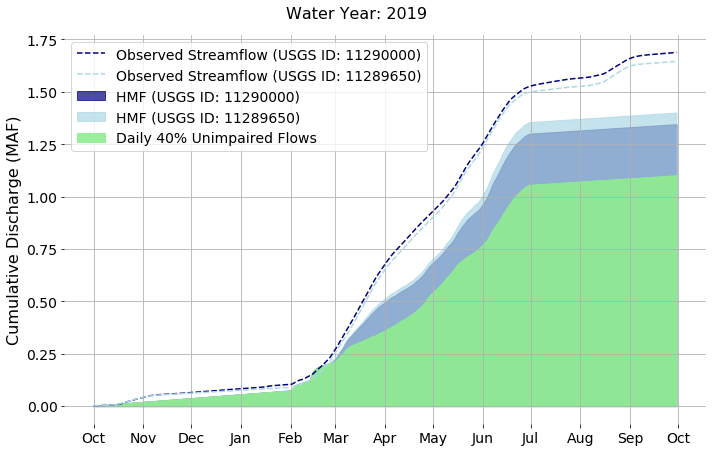

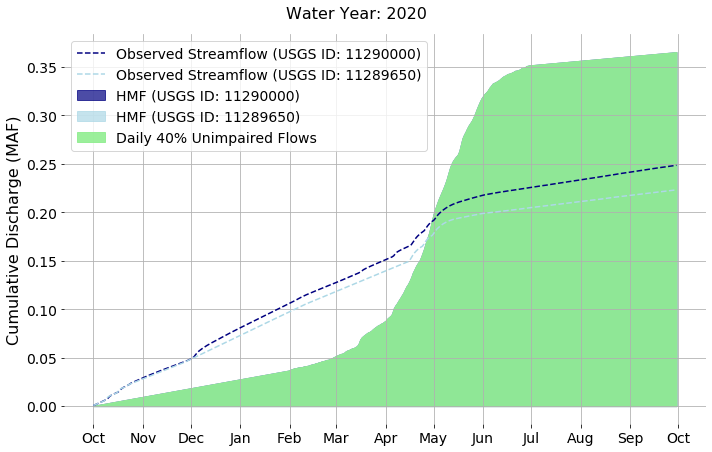

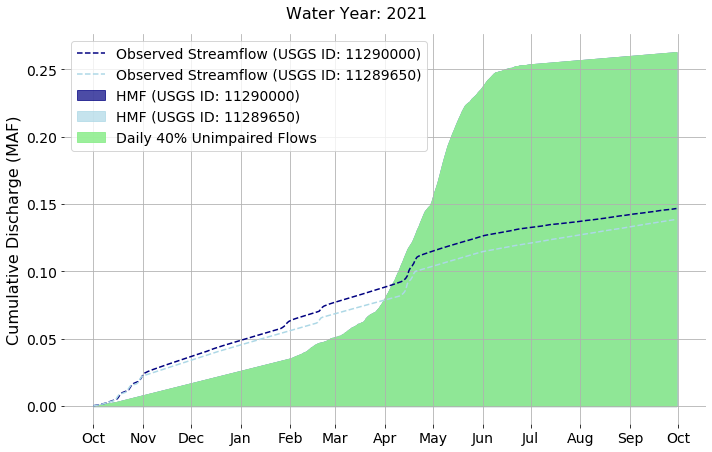

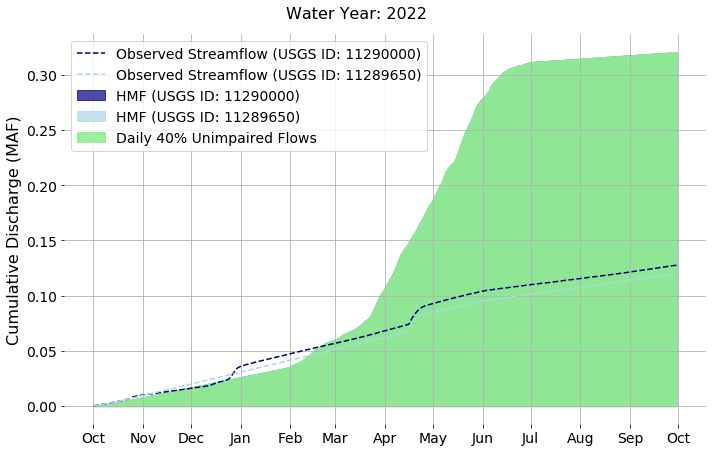

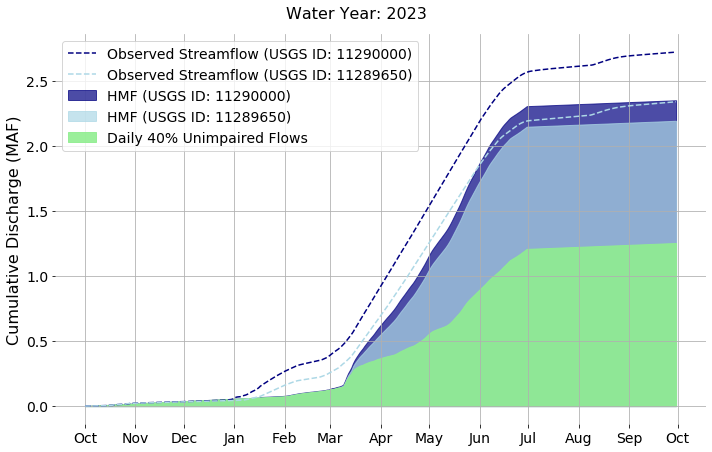

In [60]:
# Overlay plots of cumulative streamflow for: 
# 1. Observed flows (TLG and Modesto)
# 2. 40% Unimpaired flows with FERC
# 3. FNF at TLG

cfs_to_maf = 60 * 60 * 24 / 43560 / 1e6

WYs = diversions_monthly['WY'].unique()
color_list = ['navy', 'lightblue'] # swap colors (orange for Modesto, blue for La Grange)

sites = [11290000, 11289650] # swap order for plotting

for i, WY in enumerate(WYs):
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10,8))
    
    # Plot 40% Unimpaired flows with FERC daily streamflow    
    fnf_df = fnf_ferc_11289650[fnf_ferc_11289650['WY'] == WY]
    #ax.fill_between(fnf_df.index, (fnf_df['flow_cfs']*cfs_to_maf).cumsum(), color='seagreen', alpha=1, label='Daily 40% Unimpaired Flows')
    
    # Plot daily streamflow for each gage
    for j, site_id in enumerate(sites):
        
        obs_df = flowDict['obs_'+str(site_id)]
        obs_df = obs_df[obs_df['WY'] == WY] # only select rows associated with WY of each loop
        ax.fill_between(obs_df.index, ((obs_df['HMF_cfs'] + fnf_df['flow_cfs'])*cfs_to_maf).cumsum(), color=color_list[j], alpha=0.7, label=f'HMF (USGS ID: {site_id})')
        ax.plot((obs_df['flow_cfs']*cfs_to_maf).cumsum(), color=color_list[j], linestyle='--', label=f'Observed Streamflow (USGS ID: {site_id})')
        
        #Plot 90th percentile threshold for each gage
        #ax.axhline(y = thresholds_flowDict[site_id][selected_threshold][int(site_id)]*cfs_to_maf, color=color_list[j], linestyle='--', label=f'90th Percentile (USGS ID: {site_id})')
    
#     # Plot water rights allocations
#     div_df = diversions_monthly[diversions_monthly['WY'] == WY]
#     ax.fill_between(div_df.index, div_df['mag_MAF'].cumsum(), color='coral', alpha=0.4, label=f'Water Rights Diversions')
    
#     # Plot daily streamflow for single gauge
#     obs_df = flowDict['obs_'+str(site_id)]
#     obs_df = obs_df[obs_df['WY'] == WY] # only select rows associated with WY of each loop
#     ax.fill_between(obs_df.index, ((obs_df['HMF_cfs'] + fnf_df['flow_cfs'])*cfs_to_maf).cumsum(), color='C0', alpha = 0.4, label=f'HMF')
#     ax.plot((obs_df['flow_cfs']*cfs_to_maf).cumsum(), color='C0', linestyle='--', label=f'Observed Streamflow')
        
    # Plot 40% Unimpaired flows with FERC daily streamflow    
    #fnf_df = fnf_ferc_11289650[fnf_ferc_11289650['WY'] == WY]
    ax.fill_between(fnf_df.index, (fnf_df['flow_cfs']*cfs_to_maf).cumsum(), color='lightgreen', alpha=0.9, label='Daily 40% Unimpaired Flows')
    
    #ax.fill_between(div_df.index, (fnf_df['flow_cfs']*cfs_to_maf).cumsum() + div_df['mag_MAF'].cumsum(), color='coral', alpha=0.7, label=f'Water Rights Allocations')
    #ax.plot(selected_df['flow_cfs'], color='coral', label='Water Rights Allocations', alpha=0.9)
    
    # Plot FNF values (TNC)
    #ceff_df = ceff_mean_11289650[ceff_mean_11289650['WY'] == WY]
    #ax.plot((ceff_df['flow_area_cfs']*cfs_to_maf).cumsum(), color='g', label='FNF at TLG (TNC)')

    # Plot legend
    ax.legend(loc='upper left', fontsize=14)
    
    # Plot month names instead of numerical dates
    plt.gca().xaxis.set_major_locator(MonthLocator())
    plt.gca().xaxis.set_major_formatter(DateFormatter('%b'))  # %b for month abbreviation
    ax.tick_params(axis='both', which='major', labelsize=14)
    
    # Add title to plot
    fig.suptitle(f'Water Year: {WY}', fontsize=16)
    #fig.suptitle(f'Water Year: {WY} ({WYT_1994_2023[i]})', fontsize=16)
    
    # Remove border
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    
    ax.set_ylabel(f'Cumulative Discharge (MAF)', fontsize=16)
    #ax.set_ylabel(f'Discharge (cfs)')
    plt.tight_layout(rect=[0, 0.20, 1, 0.95])
    file_name = 'C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\results\\figures\\timeseries\\streamflow\\Tuol\\gage_comparison\\tuol_cumulative_flow_'+WY+'.png'
    plt.savefig(file_name, bbox_inches="tight")
    plt.show()

In [31]:
# Create stacked bar plots to show the percentage of total streamflow available and used by water year
sites = [11290000, 11289650]
daily_discharge_list = ['obs_11289650', 'obs_11290000', 'fnf_11289650', 'fnf_ferc_11289650']
annual_mag_df = pd.DataFrame()

for daily_discharge in daily_discharge_list:
    flowDict[daily_discharge].index = pd.to_datetime(flowDict[daily_discharge].index) # convert Index to DatetimeIndex
    if daily_discharge in ['obs_11289650', 'obs_11290000']:
        annual_mag_df[daily_discharge] = (flowDict[daily_discharge]['flow_cfs']*cfs_to_maf).resample('AS-OCT').sum()
        annual_mag_df[daily_discharge+'_HMF'] = (flowDict[daily_discharge]['HMF_cfs']*cfs_to_maf).resample('AS-OCT').sum()
    else:
        annual_mag_df[daily_discharge] = (flowDict[daily_discharge]['flow_cfs']*cfs_to_maf).resample('AS-OCT').sum()

# Add WYT to dataframe
add_WY_DOHY_month(annual_mag_df)
# Add line for WYT

# Calculate the percentage of HMF and 40% impaired flows for total streamflow


# Create stacked bar plots to show volume used for 40% impaired flow and HMFs for each year and use averages by WYT


,obs_11289650,obs_11289650_HMF,obs_11290000,obs_11290000_HMF,fnf_11289650,fnf_ferc_11289650,month,WY,DOY,DOHY
datetime,,,,,,,,,,
1993-10-01,0.187313,0.000000,0.266190,0.000000,0.893152,0.336248,10,1994,274,1
1994-10-01,2.184597,0.630645,2.388980,0.632707,3.906575,1.154816,10,1995,274,1
1995-10-01,1.193843,0.106671,1.405500,0.137058,2.357365,0.896679,10,1996,274,1
1996-10-01,1.954320,0.850433,2.275462,1.013375,3.253971,0.755172,10,1997,275,2
1997-10-01,2.006106,0.305574,2.222668,0.342486,3.359777,1.074832,10,1998,274,1
1998-10-01,0.982980,0.070532,1.138358,0.064701,2.116155,0.789906,10,1999,274,1
1999-10-01,0.776087,0.057521,0.942432,0.051709,1.999230,0.797151,10,2000,274,1
2000-10-01,0.293728,0.000000,0.435154,0.000000,1.143161,0.437483,10,2001,275,2
2001-10-01,0.149787,0.000000,0.263625,0.000000,1.463403,0.503015,10,2002,274,1


Sample hydrograph with shaded portions for water uses

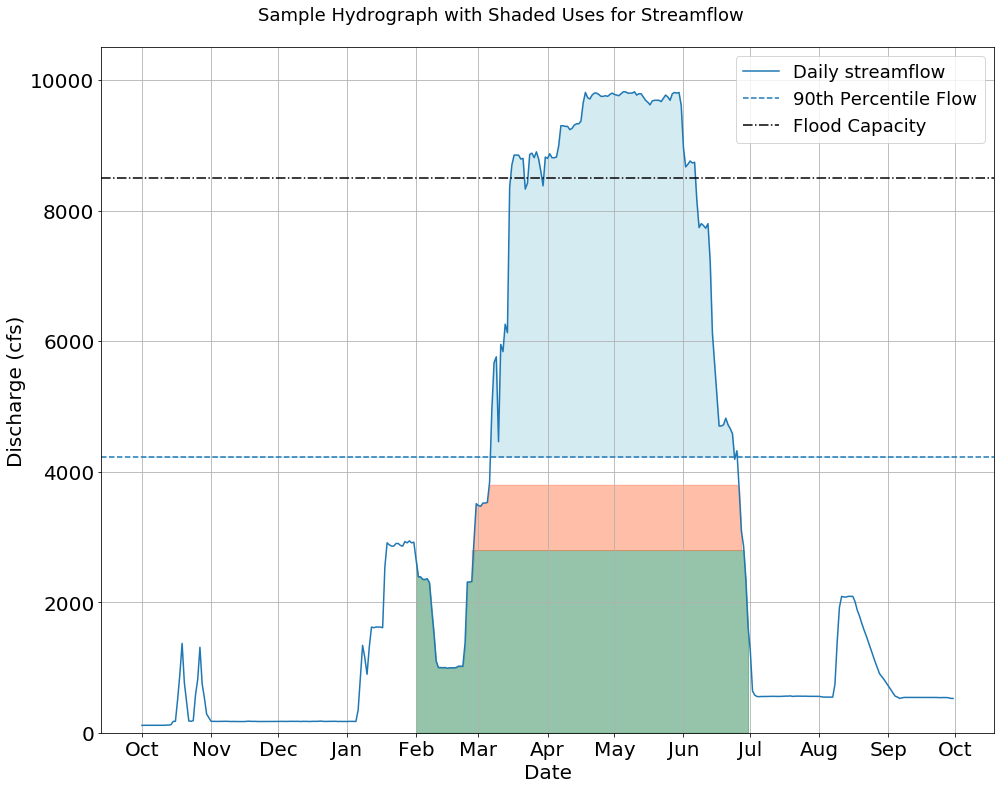

In [159]:
# Set year for sample hydrograph
year = '2023'

## Envrionmental flows
# Find the average monthly streamflow for unimp ferc flows from Feb - June
# feb_jun_sum = flowDict['fnf_ferc_11289650'].loc[flowDict['fnf_ferc_11289650']['flow_cfs'].index.month.isin([2,3,4,5,6])].resample('YS').sum()
# avg_unimp = feb_jun_sum.loc[year+'-01-01']['flow_cfs']/(28+31+30+31+30)
unimp_threshold = 2800

# Define the date range
# start_date = datetime(int(year)-1, 10, 1)
# end_date = datetime(int(year), 9, 30)
start_date_df = datetime(int(year), 2, 1)
end_date_df = datetime(int(year), 6, 30)

# Generate dates within the range
date_range = pd.date_range(start=start_date_df, end=end_date_df, freq='D')

# Create column in df for flows greater than threshold
flowDict['obs_11289650']['above_threshold'] = flowDict['obs_11289650']['flow_cfs'] > unimp_threshold
date_range_df = flowDict['obs_11289650'][str(int(year)-1)+'-10-01':year+'-09-30']
#date_range_df = flowDict['obs_11289650'][year+'-02-01':year+'-06-30']

# Create a DataFrame where the flow equals max unimpaired flow if greater than flow_cfs for that date
flow_list = date_range_df.apply(lambda row: unimp_threshold if row['above_threshold'] else row['flow_cfs'], axis=1)
unimp_plot = pd.DataFrame(index=date_range, data={'flow_cfs': flow_list})

# Create df of water rights usage values under observed flow or set y-value
# Define the date range and threshold
#start_date = datetime(int(year)-1, 10, 1)
#end_date = datetime(int(year), 9, 30)
start_date_df = datetime(int(year), 2, 26)
end_date_df = datetime(int(year), 6, 27)
wr_threshold = 3800 #cfs

# Generate dates within the range
date_range = pd.date_range(start=start_date_df, end=end_date_df, freq='D')

# Create column in df for flows greater than threshold
flowDict['obs_11289650']['above_threshold'] = flowDict['obs_11289650']['flow_cfs'] > wr_threshold
date_range_df = flowDict['obs_11289650'][year+'-02-01':year+'-06-30']

# Create a DataFrame where the flow equals max unimpaired flow if greater than flow_cfs for that date
flow_list = date_range_df.apply(lambda row: wr_threshold if row['above_threshold'] else row['flow_cfs'], axis=1)
wr_plot = pd.DataFrame(index=date_range, data={'flow_cfs': flow_list})

# Create df of recharge usage values under observed flow or set y-value
# Define the date range and threshold
#start_date = datetime(int(year)-1, 10, 1)
#end_date = datetime(int(year), 9, 30)
#start_date_df = datetime(int(year), 3, 7)
#end_date_df = datetime(int(year), 6, 22)
#hmf_threshold = 4230 #cfs

# Generate dates within the range
#date_range = pd.date_range(start=start_date_df, end=end_date_df, freq='D')

# Create corresponding values (you can replace this with your own logic)
#flowDict['obs_11289650']['above_avg_fnf'] = flowDict['obs_11289650']['flow_cfs'] > wr_threshold
#date_range_df = flowDict['obs_11289650'][year+'-02-01':year+'-06-30']

# Create a DataFrame
#flow_list = date_range_df.apply(lambda row: wr_threshold if row['above_avg_fnf'] else row['flow_cfs'], axis=1)
#hmf_plot = pd.DataFrame(index=date_range, data={'flow_cfs': date_range_df['flow_cfs']})

flowDict['obs_11289650']['HMF_cfs_plot'] = flowDict['obs_11289650']['HMF_cfs'] + thresholds_flowDict[11289650]['p90'][11289650]
flowDict['obs_11290000']['HMF_cfs_plot'] = flowDict['obs_11290000']['HMF_cfs'] + thresholds_flowDict[11290000]['p90'][11290000]

#################################################

# Observed flows only for presentation
#year = '2023'

#sites = [11289650, 11290000] # Tuolumne R Bl Lagrange Dam Nr Lagrange CA, Tuolumne R at Modesto
site_id = 11289650

cfs_to_maf = 60 * 60 * 24 / 43560 / 1e6
color_list = ['C0', 'C1']

# Initalize figure
plt.rcParams['axes.grid'] = True
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(14,14))
    
# Plot daily streamflow for selected gage   
temp_df = flowDict['obs_'+str(site_id)]
selected_df = temp_df[temp_df['WY'] == year] # only select rows associated with WY of each loop
ax.plot(selected_df['flow_cfs'], label=f'Daily streamflow')
#ax.plot(selected_df['flow_cfs']*cfs_to_maf, label=f'Site ID = {site_id}')
        
# Plot 90th percentile threshold for each gage
ax.axhline(y = thresholds_flowDict[site_id][selected_threshold][int(site_id)], color='C0', linestyle='--', label=f'90th Percentile Flow')
    
# Plot flood capacity 
ax.axhline(y=8500, color='black', linestyle='-.', label='Flood Capacity')

# Plot environmental flows
ax.fill_between(x=unimp_plot['flow_cfs'].index, y1=0, y2=unimp_plot['flow_cfs'], color='seagreen', alpha=0.5) #label='Daily 40% Unimpaired Flows')
#ax.fill_betweenx(y=[0, avg_fnf], x1=738552.0, x2=738702.0, color='skyblue', alpha=0.5, label='Area Below Line')

# Plot wr flows
ax.fill_between(x=wr_plot['flow_cfs'].index, y1=unimp_threshold, y2=wr_plot['flow_cfs'], color='coral', alpha=0.5) #label='Water Rights Allocations')

# Plot HMF
ax.fill_between(x=selected_df['flow_cfs'].index, y1=thresholds_flowDict[11289650]['p90'][11289650], y2=selected_df['HMF_cfs_plot'], color='lightblue', alpha=0.5) #label='HMF')

# Plot legend
ax.legend(loc = 'upper right', fontsize=18)
    
# Plot month names instead of numerical dates
plt.gca().xaxis.set_major_locator(MonthLocator())
plt.gca().xaxis.set_major_formatter(DateFormatter('%b'))  # %b for month abbreviation
    
# Add title to plot
fig.suptitle(f'Sample Hydrograph with Shaded Uses for Streamflow', fontsize=18)
#fig.suptitle(f'Water Year: {WY}, Wet', fontsize=18)
    
# Edit tick and axis properties
ax.tick_params(axis='both', which='major', labelsize=20)
#ax.set_ylabel(f'Discharge (MAF/day)')
ax.set_ylabel(f'Discharge (cfs)', fontsize=20)
ax.set_xlabel(f'Date', fontsize=20)
ax.set_ylim(0, 10500)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
    
# Save plot
plt.tight_layout(rect=[0, 0.20, 1, 0.95])
file_name = 'C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\results\\figures\\timeseries\\streamflow\\Tuol\\gage_comparison\\sample_shaded_hydrograph_'+year+'.png'
plt.savefig(file_name, bbox_inches="tight")
plt.show()

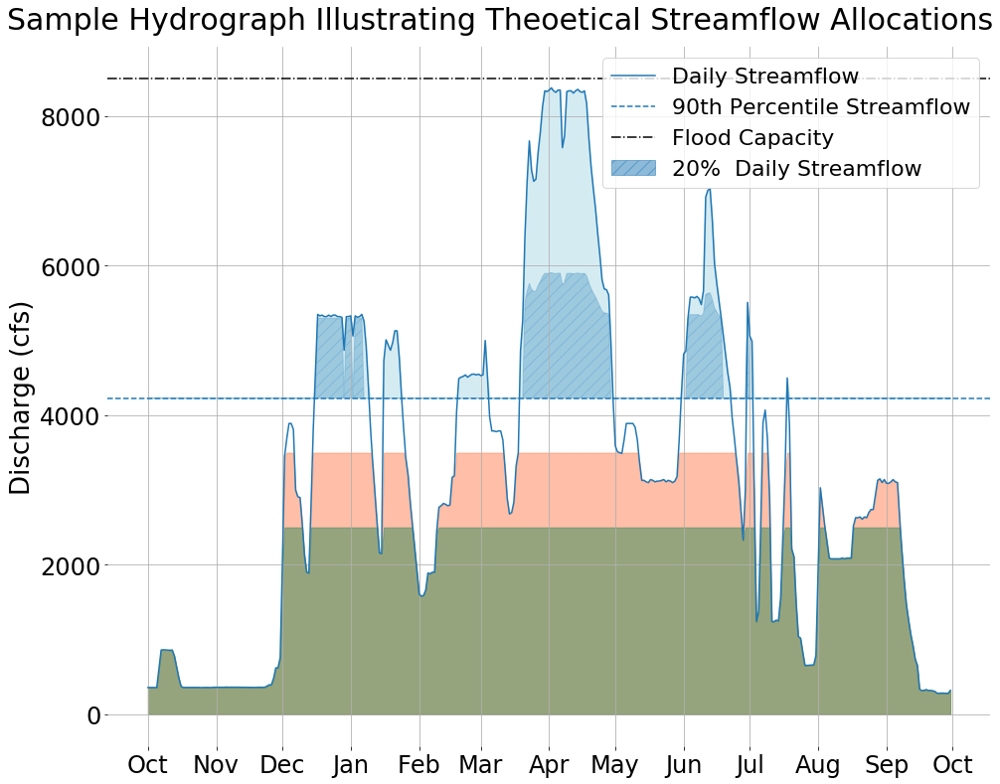

In [274]:
# Set year for sample hydrograph
year = '2011'

## Envrionmental flows
# Find the average monthly streamflow for unimp ferc flows from Feb - June
# feb_jun_sum = flowDict['fnf_ferc_11289650'].loc[flowDict['fnf_ferc_11289650']['flow_cfs'].index.month.isin([2,3,4,5,6])].resample('YS').sum()
# avg_unimp = feb_jun_sum.loc[year+'-01-01']['flow_cfs']/(28+31+30+31+30)
unimp_threshold = 2500

# Define the date range
start_date_df = datetime(int(year)-1, 10, 1)
end_date_df = datetime(int(year), 9, 30)

# Generate dates within the range
date_range = pd.date_range(start=start_date_df, end=end_date_df, freq='D')

# Create column in df for flows greater than threshold
flowDict['obs_11289650']['above_threshold'] = flowDict['obs_11289650']['flow_cfs'] > unimp_threshold
date_range_df = flowDict['obs_11289650'][str(int(year)-1)+'-10-01':year+'-09-30']
#date_range_df = flowDict['obs_11289650'][year+'-02-01':year+'-06-30']

# Create a DataFrame where the flow equals max unimpaired flow if greater than flow_cfs for that date
flow_list = date_range_df.apply(lambda row: unimp_threshold if row['above_threshold'] else row['flow_cfs'], axis=1)
unimp_plot = pd.DataFrame(index=date_range, data={'flow_cfs': flow_list})

## Water rights holders diversions
# Define the date range and threshold
start_date_df = datetime(int(year)-1, 10, 1)
end_date_df = datetime(int(year), 9, 30)
wr_threshold = 3500 #cfs

# Generate dates within the range
date_range = pd.date_range(start=start_date_df, end=end_date_df, freq='D')

# Create column in df for flows greater than threshold
flowDict['obs_11289650']['above_threshold'] = flowDict['obs_11289650']['flow_cfs'] > wr_threshold
date_range_df = flowDict['obs_11289650'][str(int(year)-1)+'-10-01':year+'-09-30']

# Create a DataFrame where the flow equals max unimpaired flow if greater than flow_cfs for that date
flow_list = date_range_df.apply(lambda row: wr_threshold if row['above_threshold'] else row['flow_cfs'], axis=1)
wr_plot = pd.DataFrame(index=date_range, data={'flow_cfs': flow_list})

# Create df of recharge usage values under observed flow or set y-value
# Define the date range and threshold
#start_date = datetime(int(year)-1, 10, 1)
#end_date = datetime(int(year), 9, 30)
#start_date_df = datetime(int(year), 3, 7)
#end_date_df = datetime(int(year), 6, 22)
#hmf_threshold = 4230 #cfs

# Generate dates within the range
#date_range = pd.date_range(start=start_date_df, end=end_date_df, freq='D')

# Create corresponding values (you can replace this with your own logic)
#flowDict['obs_11289650']['above_avg_fnf'] = flowDict['obs_11289650']['flow_cfs'] > wr_threshold
#date_range_df = flowDict['obs_11289650'][year+'-02-01':year+'-06-30']

# Create a DataFrame
#flow_list = date_range_df.apply(lambda row: wr_threshold if row['above_avg_fnf'] else row['flow_cfs'], axis=1)
#hmf_plot = pd.DataFrame(index=date_range, data={'flow_cfs': date_range_df['flow_cfs']})

flowDict['obs_11289650']['HMF_cfs_plot'] = flowDict['obs_11289650']['HMF_cfs'] + thresholds_flowDict[11289650]['p90'][11289650]
flowDict['obs_11290000']['HMF_cfs_plot'] = flowDict['obs_11290000']['HMF_cfs'] + thresholds_flowDict[11290000]['p90'][11290000]

# assign column with 20% of daily streamflow in instances when it is less than flow above p90 exceeds
flowDict['obs_11289650']['pct20'] = [flow*0.2 for flow in flowDict['obs_11289650']['flow_cfs']]
threshold = float(thresholds_flowDict[11289650]['p90'][11289650])
flowDict['obs_11289650']['flow_above_threshold_cfs'] = [(flow - threshold) if flow > threshold else 0 for flow in flowDict['obs_11289650']['flow_cfs']]
#daily['pct20_plus_threshold'] = [flow*0.2 for flow in daily['flow_cfs']]+thresholds_obs.loc[site_id, 'p90']
flowDict['obs_11289650']['p90_pct20_diff'] = flowDict['obs_11289650']['flow_above_threshold_cfs'] - flowDict['obs_11289650']['pct20']
flowDict['obs_11289650'].loc[flowDict['obs_11289650']['p90_pct20_diff'] > 0, 'pct20_rev'] = flowDict['obs_11289650']['pct20']
flowDict['obs_11289650']['pct20_rev'] = flowDict['obs_11289650']['pct20_rev'].fillna(0)

#################################################

#sites = [11289650, 11290000] # Tuolumne R Bl Lagrange Dam Nr Lagrange CA, Tuolumne R at Modesto
site_id = 11289650

cfs_to_maf = 60 * 60 * 24 / 43560 / 1e6
color_list = ['C0', 'C1']

# Initalize figure
plt.rcParams['axes.grid'] = True
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(14,14))
    
# Plot daily streamflow for selected gage   
temp_df = flowDict['obs_'+str(site_id)]
selected_df = temp_df[temp_df['WY'] == year] # only select rows associated with WY of each loop
ax.plot(selected_df['flow_cfs'], label=f'Daily Streamflow')
#ax.plot(selected_df['flow_cfs']*cfs_to_maf, label=f'Site ID = {site_id}')

# Plot 20% of flow daily flow for selected gauge
#ax.plot(selected_df['pct20_rev']+thresholds_flowDict[11289650]['p90'][11289650], color='C0', linestyle='-', label=f'20% Daily Streamflow')
ax.fill_between(x=selected_df['pct20_rev'].index, y1=thresholds_flowDict[11289650]['p90'][11289650], y2=selected_df['pct20_rev']+thresholds_flowDict[11289650]['p90'][11289650], 
                hatch='//', color='C0', alpha=0.5, label='20%  Daily Streamflow')
        
# Plot 90th percentile threshold for each gage
ax.axhline(y = thresholds_flowDict[site_id][selected_threshold][int(site_id)], color='C0', linestyle='--', label=f'90th Percentile Streamflow')
    
# Plot flood capacity 
ax.axhline(y=8500, color='black', linestyle='-.', label='Flood Capacity')

# Plot wr flows
ax.fill_between(x=wr_plot['flow_cfs'].index, y1=wr_plot['flow_cfs'], color='coral', alpha=0.5) #label='Water Rights Allocations')
#ax.fill_between(x=wr_plot['flow_cfs'].index, y1=unimp_threshold, y2=wr_plot['flow_cfs'], color='coral', alpha=0.5) #label='Water Rights Allocations')

# Plot environmental flows
ax.fill_between(x=unimp_plot['flow_cfs'].index, y1=0, y2=unimp_plot['flow_cfs'], color='seagreen', alpha=0.5) #label='Daily 40% Unimpaired Flows')
#ax.fill_betweenx(y=[0, avg_fnf], x1=738552.0, x2=738702.0, color='skyblue', alpha=0.5, label='Area Below Line')

# Plot recharge flows
ax.fill_between(x=selected_df['flow_cfs'].index, y1=thresholds_flowDict[11289650]['p90'][11289650], y2=selected_df['HMF_cfs_plot'], color='lightblue', alpha=0.5) #label='HMF')

# Plot legend
ax.legend(loc = 'upper right', fontsize=22)
    
# Plot month names instead of numerical dates
plt.gca().xaxis.set_major_locator(MonthLocator())
plt.gca().xaxis.set_major_formatter(DateFormatter('%b'))  # %b for month abbreviation
    
# Add title to plot
fig.suptitle(f'Sample Hydrograph Illustrating Theoetical Streamflow Allocations', fontsize=30)
#fig.suptitle(f'Water Year: {WY}, Wet', fontsize=18)
    
# Edit tick and axis properties
ax.tick_params(axis='both', which='major', labelsize=24)
#ax.set_ylabel(f'Discharge (MAF/day)')
ax.set_ylabel(f'Discharge (cfs)', fontsize=26)
#ax.set_xlabel(f'Date', fontsize=22)
#ax.set_ylim(0, 10500)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
    
# Save plot
plt.tight_layout(rect=[0, 0.20, 1, 0.95])
file_name = 'C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\results\\figures\\timeseries\\streamflow\\Tuol\\gage_comparison\\sample_shaded_hydrograph_'+year+'.png'
plt.savefig(file_name, bbox_inches="tight")
plt.show()

In [35]:
# Create df of fnf values under observed flow or set y-value
# Define the date range
start_date = datetime(2023, 2, 1)
end_date = datetime(2023, 6, 30)

# Generate dates within the range
date_range = pd.date_range(start=start_date, end=end_date, freq='D')

# Create corresponding values (you can replace this with your own logic)
flowDict['obs_11289650']['above_avg_fnf'] = flowDict['obs_11289650']['flow_cfs'] > avg_fnf
date_range_df = flowDict['obs_11289650']['2023-02-01':'2023-06-30']

# Create a DataFrame
flow_list = date_range_df.apply(lambda row: avg_fnf if row['above_avg_fnf'] else row['flow_cfs'], axis=1)
fnf_area = pd.DataFrame(index=date_range, data={'flow_cfs': flow_list})

## Boxplots comparing annual flow magnitude (observed, HMF, env., water rights)

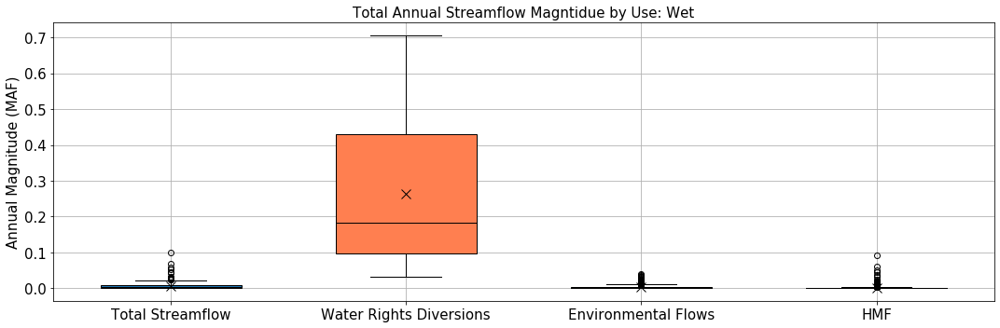

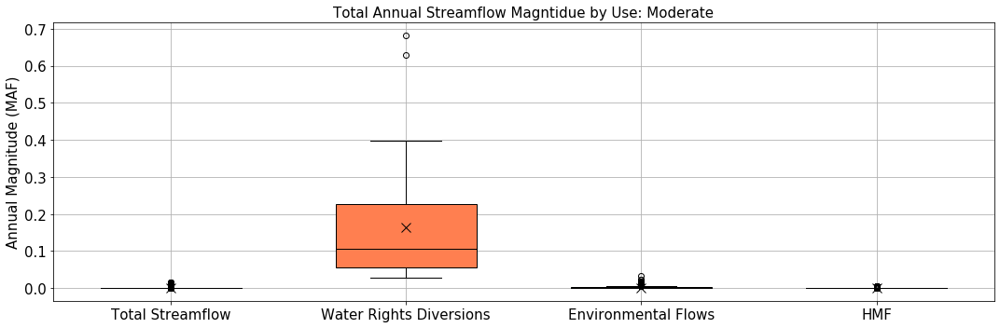

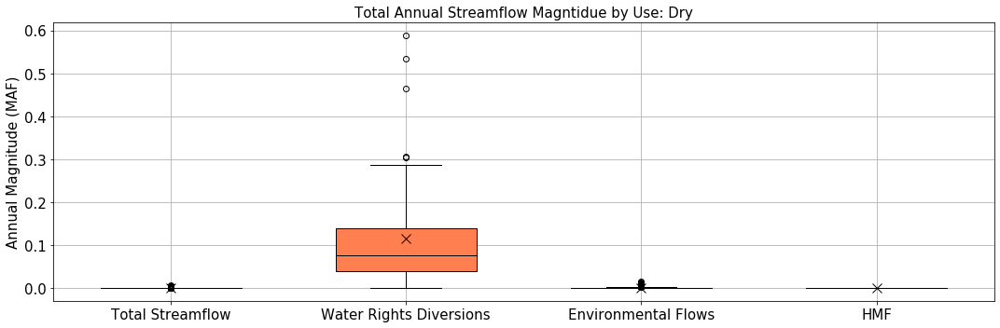

In [36]:
ticks = ['Total Streamflow','Water Rights Diversions', 'Environmental Flows', 'HMF']
WYTs = ['Wet', 'Moderate', 'Dry']
yaxes = 'Annual Magnitude (MAF)'
dfs = [flowDict['obs_11289650'], diversions_monthly, flowDict['fnf_ferc_11289650'], flowDict['obs_11289650']]
color_list = ['C0', 'coral', 'seagreen', 'lightblue']

for i, WYT in enumerate(WYTs):
    fig, ax = plt.subplots(figsize=(15,5))
    
    for j, df in enumerate(dfs):
        
        selected_df = df[df['WYT'] == WYT]
        if j == 0:
            ax.boxplot(selected_df['flow_cfs'] * cfs_to_maf, positions=[j], widths=0.6, patch_artist=True,
                    boxprops=dict(facecolor=color_list[j]), 
                    medianprops=dict(color='#000000'),
                    showmeans=True, meanprops={"marker":"x", "markeredgecolor":"black", "markersize":"10"})
        elif j == 1:
                ax.boxplot(selected_df['mag_MAF'], positions=[j], widths=0.6, patch_artist=True,
                    boxprops=dict(facecolor=color_list[j]), 
                    medianprops=dict(color='#000000'),
                    showmeans=True, meanprops={"marker":"x", "markeredgecolor":"black", "markersize":"10"})
        elif j == 2:
            ax.boxplot(selected_df['flow_cfs'] * cfs_to_maf, positions=[j], widths=0.6, patch_artist=True,
                    boxprops=dict(facecolor=color_list[j]), 
                    medianprops=dict(color='#000000'),
                    showmeans=True, meanprops={"marker":"x", "markeredgecolor":"black", "markersize":"10"})
        else:
            ax.boxplot(selected_df['HMF_cfs'] * cfs_to_maf, positions=[j], widths=0.6, patch_artist=True,
                    boxprops=dict(facecolor=color_list[j]), 
                    medianprops=dict(color='#000000'),
                    showmeans=True, meanprops={"marker":"x", "markeredgecolor":"black", "markersize":"10"})

    # customize plot
    plt.xticks([0, 1, 2, 3], ticks, fontsize=15)
    #ax.set_xticks([-1,0], ticks)
    ax.tick_params(axis='y', labelsize=15)
    ax.set_ylabel(yaxes, fontsize=15)
    #plt.xlim(-2, len(ticks)*3)
    #plt.ylim(0, 1)
    plt.title(f'Total Annual Streamflow Magntidue by Use: {WYTs[i]}', fontsize=15)
    plt.tight_layout()
    
    file_name = f'../results/figures/box_plots/tuol_compare_flows_by_WYT.png'
    plt.savefig(file_name, bbox_inches="tight")
    plt.show()

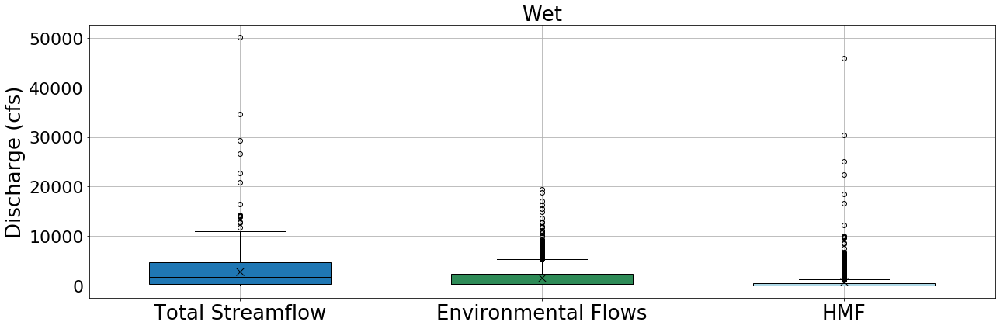

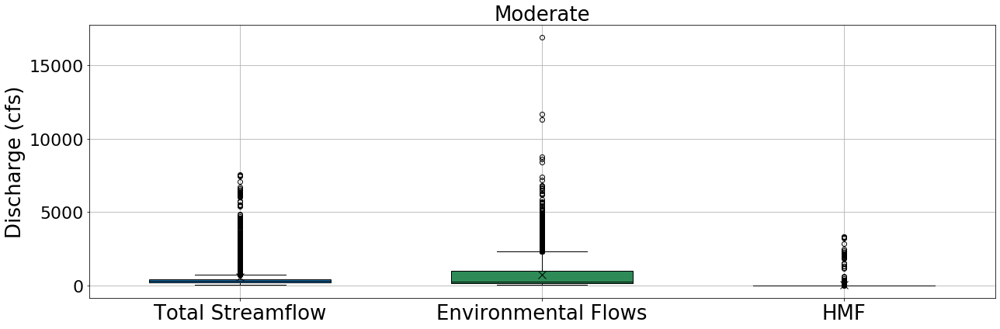

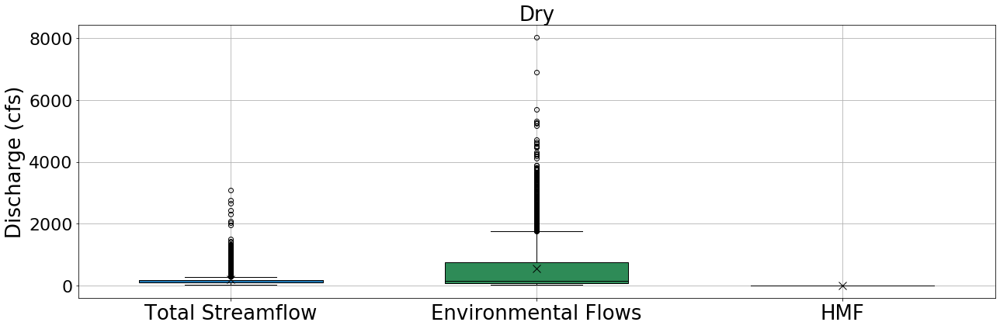

In [39]:
# No water rights

ticks = ['Total Streamflow','Environmental Flows', 'HMF']
WYTs = ['Wet', 'Moderate', 'Dry']
yaxes = 'Discharge (cfs)'
#yaxes = 'Annual Magnitude (MAF)'
dfs = [flowDict['obs_11289650'], flowDict['fnf_ferc_11289650'], flowDict['obs_11289650']]
color_list = ['C0', 'seagreen', 'lightblue']

for i, WYT in enumerate(WYTs):
    fig, ax = plt.subplots(figsize=(18,6))
    
    for j, df in enumerate(dfs):
        
        selected_df = df[df['WYT'] == WYT]
        if j == 0:
            ax.boxplot(selected_df['flow_cfs'], positions=[j], widths=0.6, patch_artist=True,
                    boxprops=dict(facecolor=color_list[j]), 
                    medianprops=dict(color='#000000'),
                    showmeans=True, meanprops={"marker":"x", "markeredgecolor":"black", "markersize":"10"})
        elif j == 1:
            ax.boxplot(selected_df['flow_cfs'], positions=[j], widths=0.6, patch_artist=True,
                    boxprops=dict(facecolor=color_list[j]), 
                    medianprops=dict(color='#000000'),
                    showmeans=True, meanprops={"marker":"x", "markeredgecolor":"black", "markersize":"10"})
        else:
            ax.boxplot(selected_df['HMF_cfs'], positions=[j], widths=0.6, patch_artist=True,
                    boxprops=dict(facecolor=color_list[j]), 
                    medianprops=dict(color='#000000'),
                    showmeans=True, meanprops={"marker":"x", "markeredgecolor":"black", "markersize":"10"})

    # customize plot
    plt.xticks([0, 1, 2], ticks, fontsize=26)
    #ax.set_xticks([-1,0], ticks)
    ax.tick_params(axis='y', labelsize=22)
    ax.set_ylabel(yaxes, fontsize=26)
    #plt.xlim(-2, len(ticks)*3)
    #plt.ylim(0, 1)
    plt.title(f'{WYTs[i]}', fontsize=26)
    plt.tight_layout()
    
    file_name = f'../results/figures/box_plots/tuol_compare_flows_by_{WYTs[i]}.png'
    plt.savefig(file_name, bbox_inches="tight")
    plt.show()

## Bar plots of annual streamflow diversions and instream uses

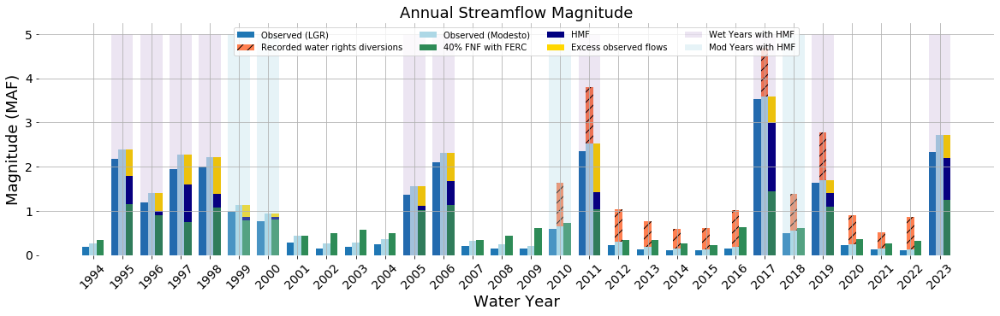

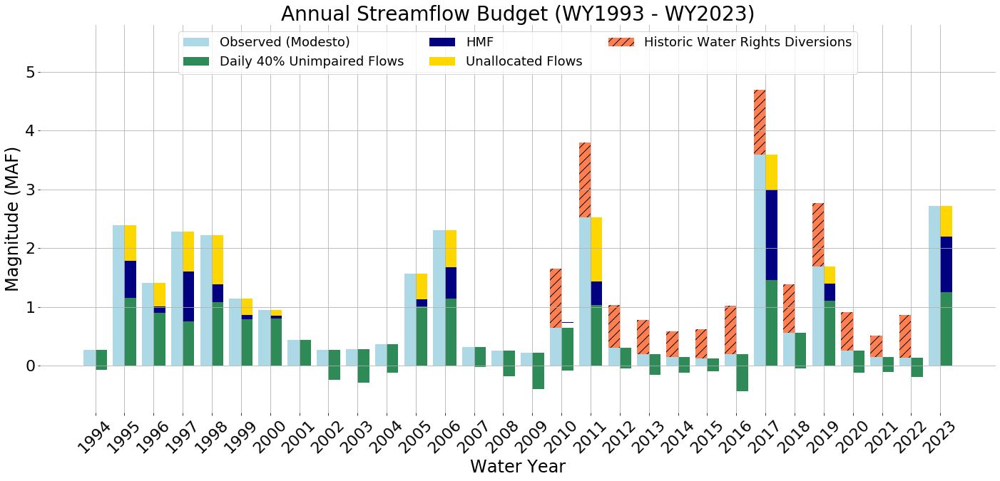

In [407]:
# Plot of average HMF magnitude by year

daily_discharge_list = ['obs_11289650', 'obs_11290000', 'fnf_ferc_11289650']

annualflowDict= {}
for daily_discharge in daily_discharge_list:
    
    # Calculate the sum of flows in MAF for each water year
    annualflowDict[daily_discharge] = flowDict[daily_discharge].groupby('WY')['flow_cfs'].sum() * cfs_to_maf # MAF

annualflowDict['obs_11289650_HMF'] = flowDict['obs_11289650'].groupby('WY')['HMF_cfs'].sum() * cfs_to_maf # MAF

# Stacked bar for excess observed flows at Modesto
annualflowDict['obs_11290000_surplus'] = annualflowDict['obs_11290000'] - annualflowDict['fnf_ferc_11289650'] - annualflowDict['obs_11289650_HMF']
#annualflowDict['obs_11290000_surplus'] = [max(0, x) for x in annualflowDict['obs_11290000_surplus']]
annualflowDict['obs_11290000_surplus'] = np.maximum(annualflowDict['obs_11290000_surplus'], 0)

# Over-allocated unimpaired flow values
annualflowDict['fnf_ferc_11289650_excess'] = annualflowDict['obs_11290000'] - annualflowDict['fnf_ferc_11289650']
annualflowDict['fnf_ferc_11289650_excess'] = np.clip(annualflowDict['fnf_ferc_11289650_excess'], a_min=None, a_max=0)
annualflowDict['fnf_ferc_11289650_max'] = [min(x, annualflowDict['fnf_ferc_11289650'][i]) for i, x in enumerate(annualflowDict['obs_11290000'])]
annualflowDict['fnf_ferc_11289650_max'] = pd.Series(annualflowDict['fnf_ferc_11289650_max'], index=annualflowDict['fnf_ferc_11289650'].index)
annualflowDict['fnf_ferc_11289650_max']

# Create categories for the x-axis
categories = flowDict['obs_11289650']['WY'].unique()

# Create bar plot
x = np.arange(len(categories)) # Create an array of x positions for the bars

# Years with HMF
hmf_years = annualflowDict['obs_11289650_HMF'][annualflowDict['obs_11289650_HMF'] != 0].index.tolist()
# HMF years: [1, 2, 3, 4, 5, 6, 11, 12, 17, 18, 23, 25, 26, 29]
# Wet years: [1, 2, 3, 4, 11, 12, 17, 23, 25, 29]
# Moderate years: [5, 6, 18, 26]
wet_years_idx = [1, 2, 3, 4, 11, 12, 17, 23, 25, 29]
mod_years_idx = [5, 6, 16, 24]

# Years with water rights data (2007-2022)
wr_years_idx = list(range(13, 29))

# Set bar width
width = 0.25  # Width of the bars

# Initialize figure
fig, ax = plt.subplots(figsize=(20,5))

bar1 = ax.bar(x - width, annualflowDict['obs_11289650'], width, color='C0', label='Observed (LGR)')
bar12 = ax.bar(x, div_annual_subset['sum'], bottom=annualflowDict['obs_11290000'], width=width, hatch='//', color='coral', label='Recorded water rights diversions')
bar2 = ax.bar(x, annualflowDict['obs_11290000'], width, color='lightblue', label='Observed (Modesto)')
bar3 = ax.bar(x + width, annualflowDict['fnf_ferc_11289650'], width, color='seagreen', label='40% FNF with FERC')
bar4 = ax.bar(x + width, annualflowDict['obs_11289650_HMF'], bottom=annualflowDict['fnf_ferc_11289650'], width=width, color='navy', label='HMF')
bar5 = ax.bar(x + width, annualflowDict['obs_11290000_surplus'], bottom=annualflowDict['fnf_ferc_11289650']+annualflowDict['obs_11289650_HMF'], width=width, color='gold', label='Excess observed flows')
bar6 = ax.bar(wet_years_idx, 5.0, width*3, color='indigo', alpha=0.1, label='Wet Years with HMF')
bar7 = ax.bar(mod_years_idx, 5.0, width*3, color='lightblue', alpha=0.3, label='Mod Years with HMF')
#bar6 = ax.bar(x + width, 3.5, width, alpha=0.5, label='Shade2')

ax.set_xlabel('Water Year', fontsize=18)
ax.set_ylabel('Magnitude (MAF)', fontsize=18)
ax.set_title('Annual Streamflow Magnitude', fontsize=18)
ax.set_xticks(x)
ax.set_xticklabels(categories, rotation=45, fontsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.00), ncol=4)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

file_name = 'C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\results\\figures\\bar_plots\\Tuol\\tuol_annual_flow_comparison_w_tlg.png'
plt.savefig(file_name, bbox_inches="tight")
plt.show()

############### Second version #########################

# Set bar width
width = 0.4  # Width of the bars

# Initialize figure
fig, ax = plt.subplots(figsize=(24,10))

#bar1 = ax.bar(x - width, annualflowDict['obs_11289650'], width, color='C0', label='Observed (LGR)')
bar2 = ax.bar(x - width/2, annualflowDict['obs_11290000'], width=width, color='lightblue', label='Observed (Modesto)')
bar3 = ax.bar(x + width/2, annualflowDict['fnf_ferc_11289650_max'], width, color='seagreen', label='Daily 40% Unimpaired Flows')
bar3 = ax.bar(x + width/2, annualflowDict['fnf_ferc_11289650_excess'], width, color='seagreen')
bar4 = ax.bar(x + width/2, annualflowDict['obs_11289650_HMF'], bottom=annualflowDict['fnf_ferc_11289650'], width=width, color='navy', label='HMF')
bar5 = ax.bar(x + width/2, annualflowDict['obs_11290000_surplus'], bottom=annualflowDict['fnf_ferc_11289650']+annualflowDict['obs_11289650_HMF'], width=width, color='gold', label='Unallocated Flows')
bar6 = ax.bar(x - width/2, div_annual_subset['sum'], bottom=annualflowDict['obs_11290000'], width=width, hatch='//', color='coral', label='Historic Water Rights Diversions')
#bar7 = ax.bar(wet_years_idx, 6.0, width*2, color='navy', alpha=0.1, label='Wet Years with HMF')
#bar8 = ax.bar(mod_years_idx, 6.0, width*2, color='orange', alpha=0.2, label='Mod Years with HMF')
#bar6 = ax.bar(x + width, 3.5, width, alpha=0.5, label='Shade2')

# # Add annotations for highlighted xticks
# for tick in wet_years_idx:
#     index = categories.index(tick)
#     plt.annotate('(Highlighted)', xy=(index, 0), xytext=(index, -2), ha='center', va='top', textcoords='offset points')

ax.set_xlabel('Water Year', fontsize=24)
ax.set_ylabel('Magnitude (MAF)', fontsize=24)
ax.set_title('Annual Streamflow Budget (WY1993 - WY2023)', fontsize=28)
ax.set_xticks(x)
ax.set_xticklabels(categories, rotation=45, fontsize=22)
ax.tick_params(axis='y', labelsize=22)
ax.set_ylim(-0.8,5.8)
ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.00), ncol=3, fontsize=18)
#ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.4), ncol=4)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

file_name = 'C:\\Users\\kondr\\Documents\\Research\\high_magnitude_flows\\data_analysis\\results\\figures\\bar_plots\\Tuol\\tuol_annual_flow_comparison.png'
plt.savefig(file_name, bbox_inches="tight")
plt.show()

In [403]:
# Mean annual flow magnitudes
annualflowDict['div_annual_sum'] = div_annual_subset['sum']

# Set 2007, 2008, and 2009 equal to 0 since values were so low
annualflowDict['div_annual_sum'][2007] = 0
annualflowDict['div_annual_sum'][2008] = 0
annualflowDict['div_annual_sum'][2009] = 0

annual_flows_all = list(annualflowDict.keys())
print(annual_flows_all)

# Remove fnf_ferc_11289650_excess and fnf_ferc_11289650_max	from dictionary
removed_key_1 = annual_flows_all.pop(-2)
removed_key_2 = annual_flows_all.pop(-2)
annualflowDict = {key: annualflowDict[key] for key in annual_flows_all}
annual_flows = list(annualflowDict.keys())
print(annual_flows)
    
annual_mean_mag_df = pd.DataFrame()
annual_mean_mag_list = [np.mean(annualflowDict[annual_flow][annualflowDict[annual_flow] != 0]) for annual_flow in annual_flows]
annual_mean_mag_df = pd.DataFrame({
    'flow_type': annual_flows,
    'annual_mean_mag_maf': annual_mean_mag_list
})
  
#annual_mean_mag_df = annual_mean_mag_df.set_index('flow_type')
annual_mean_mag_df

['obs_11289650', 'obs_11290000', 'fnf_ferc_11289650', 'obs_11289650_HMF', 'obs_11290000_surplus', 'fnf_ferc_11289650_excess', 'fnf_ferc_11289650_max', 'div_annual_sum']
['obs_11289650', 'obs_11290000', 'fnf_ferc_11289650', 'obs_11289650_HMF', 'obs_11290000_surplus', 'div_annual_sum']


,flow_type,annual_mean_mag_maf
0,obs_11289650,0.878291
1,obs_11290000,0.994147
2,fnf_ferc_11289650,0.676726
3,obs_11289650_HMF,0.418810
4,obs_11290000_surplus,0.537062
5,div_annual_sum,0.778865


In [404]:
annual_flows

['obs_11289650',
 'obs_11290000',
 'fnf_ferc_11289650',
 'obs_11289650_HMF',
 'obs_11290000_surplus',
 'div_annual_sum']

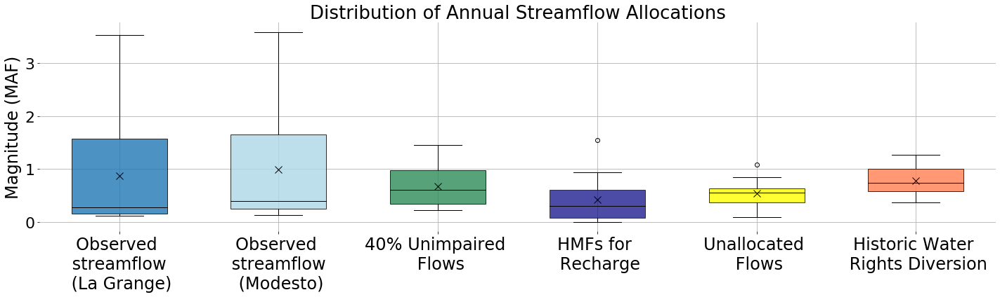

In [406]:
ticks = ['Observed \n streamflow \n (La Grange)', 'Observed \n streamflow \n (Modesto)', '40% Unimpaired \n Flows', 'HMFs for \n Recharge', 'Unallocated \n Flows', 'Historic Water \n Rights Diversion']
#WYTs = ['Wet', 'Moderate', 'Dry']
#yaxes = 'Discharge (cfs)'
yaxes = 'Magnitude (MAF)'
color_list = ['C0', 'lightblue', 'seagreen', 'navy', 'yellow', 'coral']
alpha_list = [0.8, 0.8, 0.8, 0.7, 0.8, 0.8]

fig, ax = plt.subplots(figsize=(20,6))

#data_obs_4mo[data_obs_4mo[col] != 0][col]

for j, annual_flow in enumerate(annual_flows):
    ax.boxplot(annualflowDict[annual_flow][annualflowDict[annual_flow] != 0], positions=[j], widths=0.6, patch_artist=True,
            boxprops=dict(facecolor=color_list[j], alpha=alpha_list[j]), 
            medianprops=dict(color='#000000'),
            showmeans=True, meanprops={"marker":"x", "markeredgecolor":"black", "markersize":"10"})

# customize plot
plt.xticks([0, 1, 2, 3, 4, 5], ticks, fontsize=24)
#ax.set_xticks([-1,0], ticks)
ax.tick_params(axis='y', labelsize=22)
ax.set_ylabel(yaxes, fontsize=24)
#plt.xlim(-2, len(ticks)*3)
#plt.ylim(0, 1)
plt.title(f'Distribution of Annual Streamflow Allocations', fontsize=26)
plt.tight_layout()

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

file_name = f'../results/figures/box_plots/tuol_compare_flows_by_annual_flow_types.png'
plt.savefig(file_name, bbox_inches="tight")
plt.show()

In [385]:
#list(annualflowDict.keys())
annualflowDict['div_annual_sum'][2007] = 0
annualflowDict['div_annual_sum'][2008] = 0

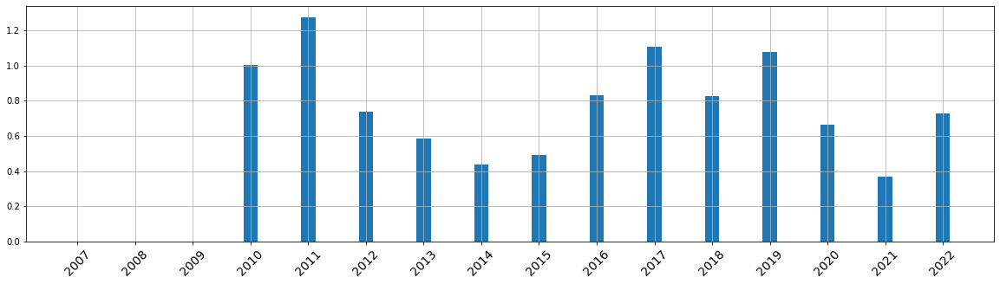

In [60]:
# Create categories for the x-axis
categories = div_annual_subset.index.unique()

# Create bar plot
x = np.arange(len(categories)) # Create an array of x positions for the bars

fig, ax = plt.subplots(figsize=(20,5))
ax.bar(x, div_annual_subset['sum'], width=0.25)
ax.set_xticks(x)
ax.set_xticklabels(categories, rotation=45, fontsize=14)
plt.show()

In [116]:
# Years with HMF
hmf_years = annualflowDict['obs_11289650_HMF'][annualflowDict['obs_11289650_HMF'] != 0].index.tolist()

['1995',
 '1996',
 '1997',
 '1998',
 '1999',
 '2000',
 '2005',
 '2006',
 '2010',
 '2011',
 '2017',
 '2018',
 '2019',
 '2023']